# Financial Analysis

### Importing Libraries

- **numpy**: For numerical operations.
- **pandas**: For data manipulation and analysis.
- **matplotlib.pyplot**: For creating static visualizations.
- **seaborn**: For statistical data visualization based on matplotlib.
- **datetime**: For manipulating dates and times.
- **yfinance**: For downloading historical market data from Yahoo Finance.
- **plotly.express**: For creating interactive visualizations.
- **scipy.stats**: For statistical functions.
- **pandas_ta**: For technical analysis indicators.
- **sklearn.cluster.KMeans**: For clustering data using K-means algorithm.
- **warnings**: To suppress warnings during execution.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import yfinance as yf
import plotly.express as px
from math import sqrt
import pandas_ta

import warnings
warnings.filterwarnings("ignore")

### Setting the Time Frame

- **today**: Captures the current date and time.
- **year_ago**: Sets the date to exactly one year prior to the current date.


In [2]:
# Setting the begining and ending
today = datetime.now()
year_ago = datetime(today.year-5, today.month, today.day)

### Defining the S&P 500 Stock List

- **sp500_list**: Manually sets a list of the top 9 S&P 500 stocks as of December 29, 2023.
  - Includes: Apple (AAPL), Microsoft (MSFT), NVIDIA (NVDA), Alphabet (GOOGL & GOOG), Meta Platforms (META), Tesla (TSLA), Berkshire Hathaway (BRK-B), and JPMorgan Chase (JPM).

*Note*: Commented out code provides an alternative method to retrieve the full list of S&P 500 companies from Wikipedia and format the stock symbols.


In [3]:
# sp500 = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')[0]

# sp500['Symbol'] = sp500['Symbol'].str.replace('.', '-')

# sp500_list = sp500['Symbol'].unique().tolist()

# Only using the top 9 stocks in the S&P 500  As of December 29,2023.
sp500_list = ["AAPL", "MSFT", "NVDA", "GOOGL",
              "GOOG", "META", "TSLA", "BRK-B", "JPM"]

### Downloading Stock Data and Creating Global Variables

- **for stock in sp500_list**: Iterates through each stock symbol in the `sp500_list`.
- **globals()[stock]**: Uses `globals()` to dynamically create a global variable named after each stock symbol.
- **yf.download(stock, start=year_ago, end=today)**: Downloads historical stock data for each stock from Yahoo Finance, using the defined date range (from `year_ago` to `today`).

In [4]:
# globals()- taking the string and makes it a global variable
for stock in sp500_list:
    globals()[stock] = yf.download(stock, start=year_ago, end=today)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [5]:
for stock in sp500_list:
    print(globals()[stock])

                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2019-06-24   49.634998   50.040001   49.542500   49.645000   47.912247   
2019-06-25   49.607498   49.814999   48.822498   48.892502   47.186016   
2019-06-26   49.442501   50.247501   49.337502   49.950001   48.206608   
2019-06-27   50.072498   50.392502   49.892502   49.935001   48.192127   
2019-06-28   49.669998   49.875000   49.262501   49.480000   47.753002   
...                ...         ...         ...         ...         ...   
2024-06-14  213.850006  215.169998  211.300003  212.490005  212.490005   
2024-06-17  213.369995  218.949997  212.720001  216.669998  216.669998   
2024-06-18  217.589996  218.630005  213.000000  214.289993  214.289993   
2024-06-20  213.929993  214.240005  208.850006  209.679993  209.679993   
2024-06-21  210.389999  211.889999  207.110001  207.490005  207.490005   

               Volume  
Date         

In [6]:
for stock in sp500_list:
    print(globals()[stock].head())

                 Open       High        Low      Close  Adj Close     Volume
Date                                                                        
2019-06-24  49.634998  50.040001  49.542500  49.645000  47.912247   72881600
2019-06-25  49.607498  49.814999  48.822498  48.892502  47.186016   84281200
2019-06-26  49.442501  50.247501  49.337502  49.950001  48.206608  104270000
2019-06-27  50.072498  50.392502  49.892502  49.935001  48.192127   83598800
2019-06-28  49.669998  49.875000  49.262501  49.480000  47.753002  124442400
                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2019-06-24  137.000000  138.399994  137.000000  137.779999  131.400177   
2019-06-25  137.250000  137.589996  132.729996  133.429993  127.251617   
2019-06-26  134.350006  135.740005  133.600006  133.929993  127.728462   
2019-06-27  134.139999  134.710007  133.509995  134.149994  127.938271   
2019-06-28  134.5

### Printing Stock Information

In [7]:
for stock in sp500_list:
    print(globals()[stock].info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1258 entries, 2019-06-24 to 2024-06-21
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       1258 non-null   float64
 1   High       1258 non-null   float64
 2   Low        1258 non-null   float64
 3   Close      1258 non-null   float64
 4   Adj Close  1258 non-null   float64
 5   Volume     1258 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 68.8 KB
None
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1258 entries, 2019-06-24 to 2024-06-21
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       1258 non-null   float64
 1   High       1258 non-null   float64
 2   Low        1258 non-null   float64
 3   Close      1258 non-null   float64
 4   Adj Close  1258 non-null   float64
 5   Volume     1258 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 68.8 KB
None


### Function: Plot Stock

- **plot_stock(stock)**: Creates a line graph showing the adjusted close prices of a specified stock over time.

- **Output**: 
  - Displays how the stock's adjusted close prices have fluctuated across different dates.
  - Enables comparison of price trends for different stocks in `sp500_list`.


In [8]:
def plot_stock(stock):
    plt.figure(figsize=(15, 7))
    plt.plot(globals()[stock]['Adj Close'])
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title(stock)
    plt.grid()
    plt.show()

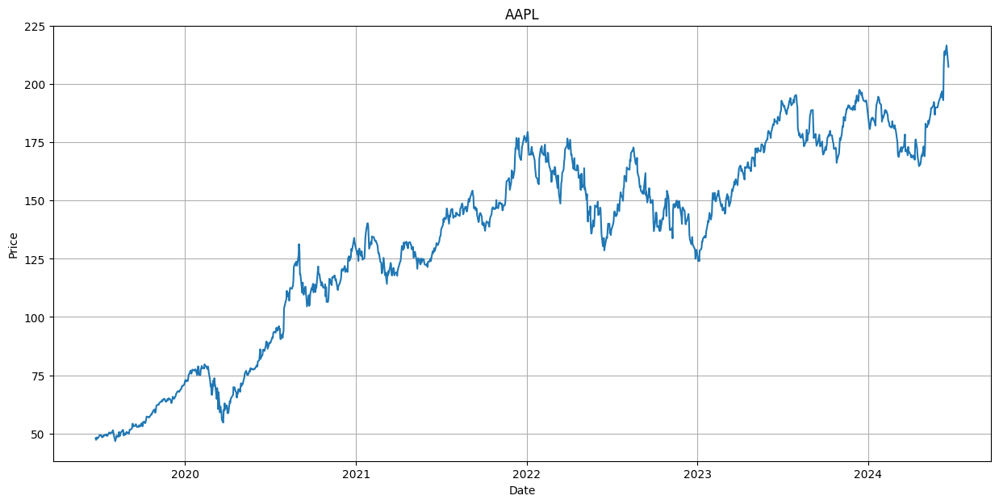

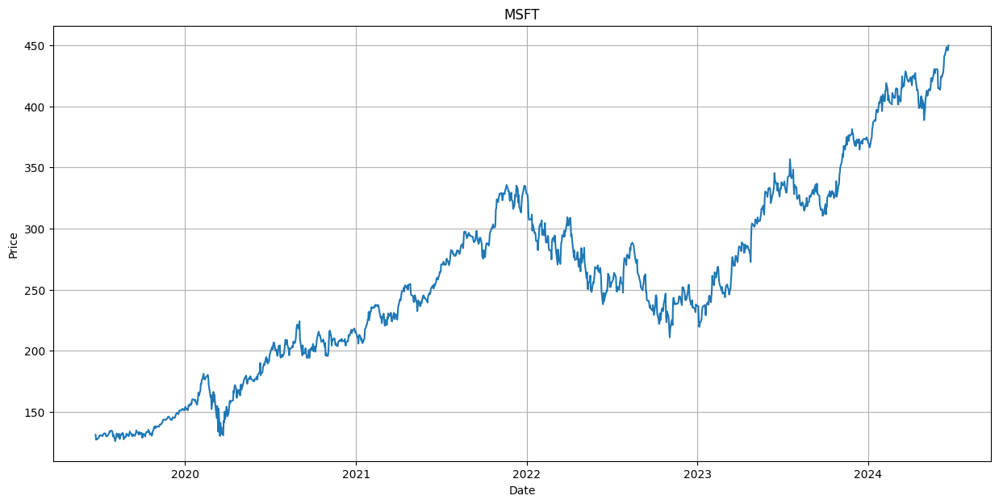

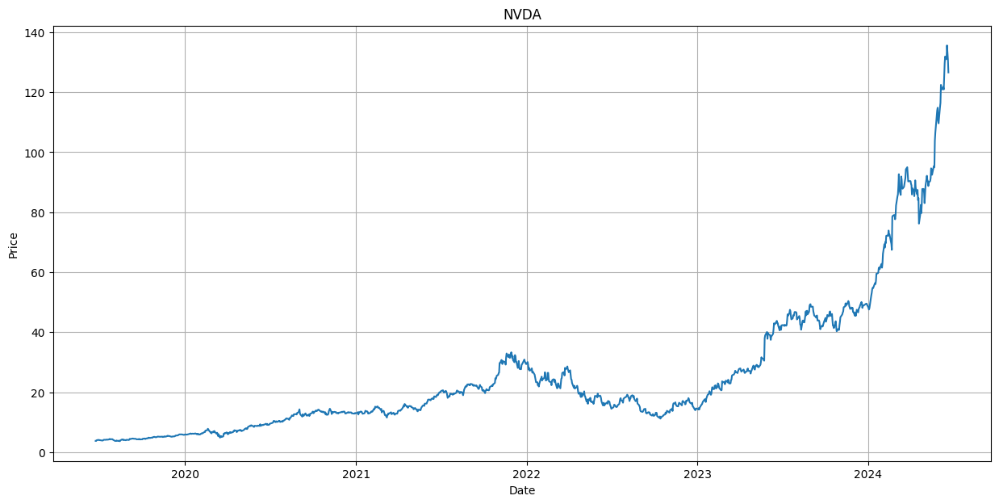

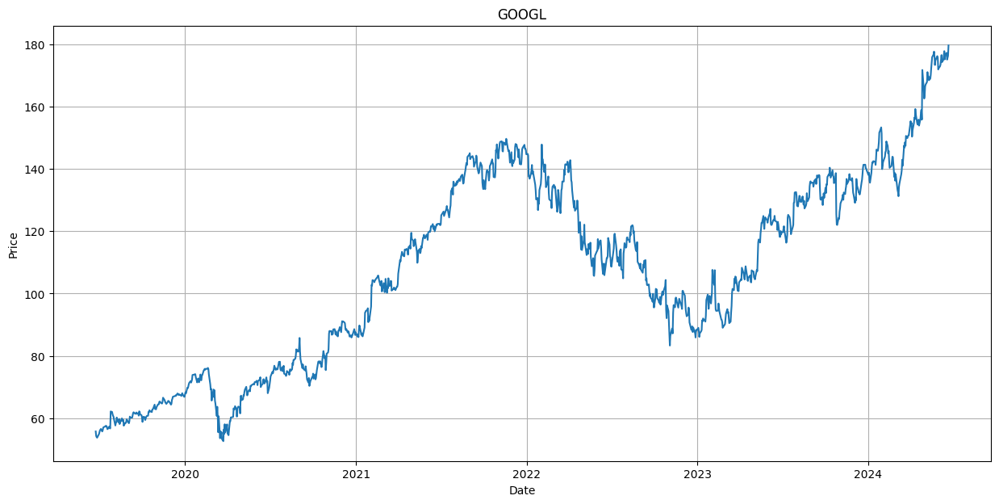

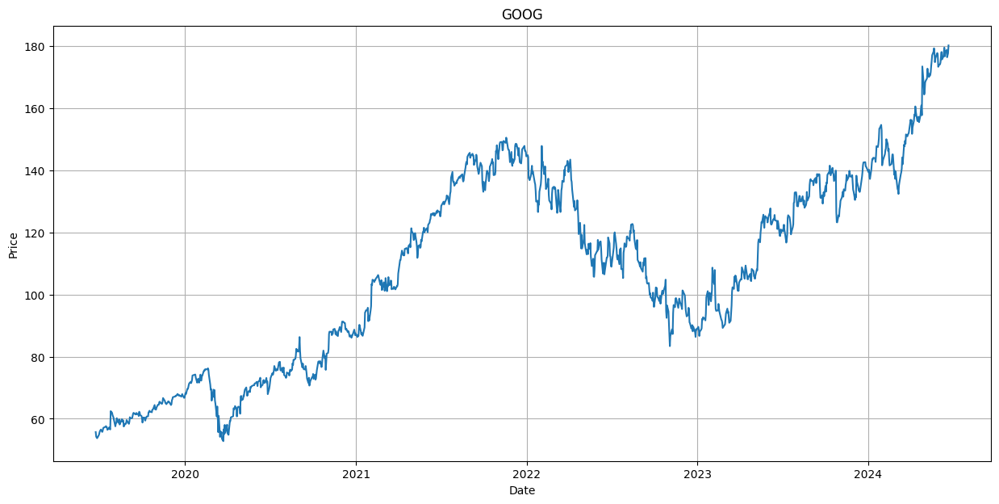

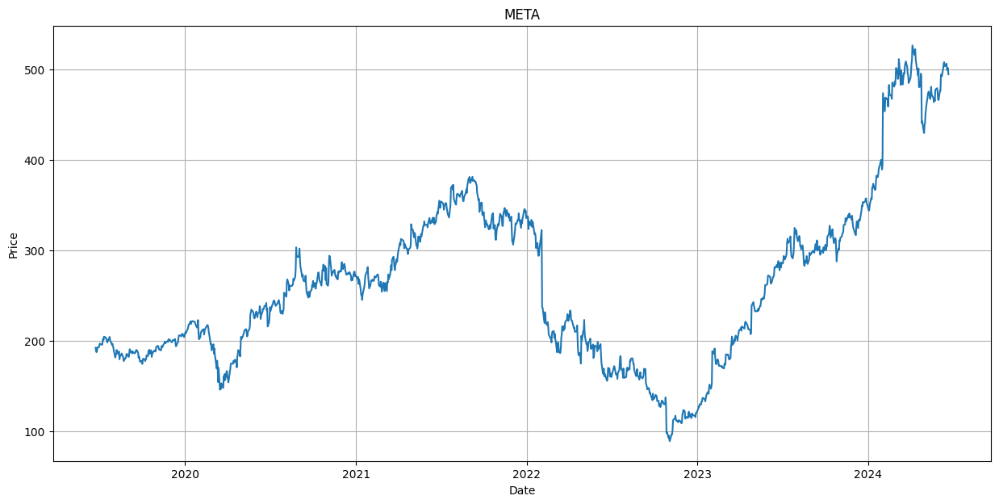

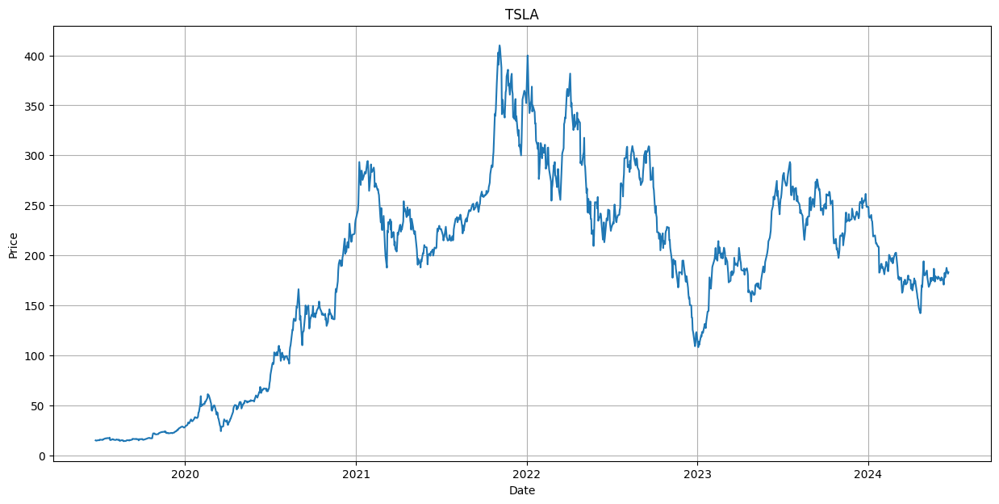

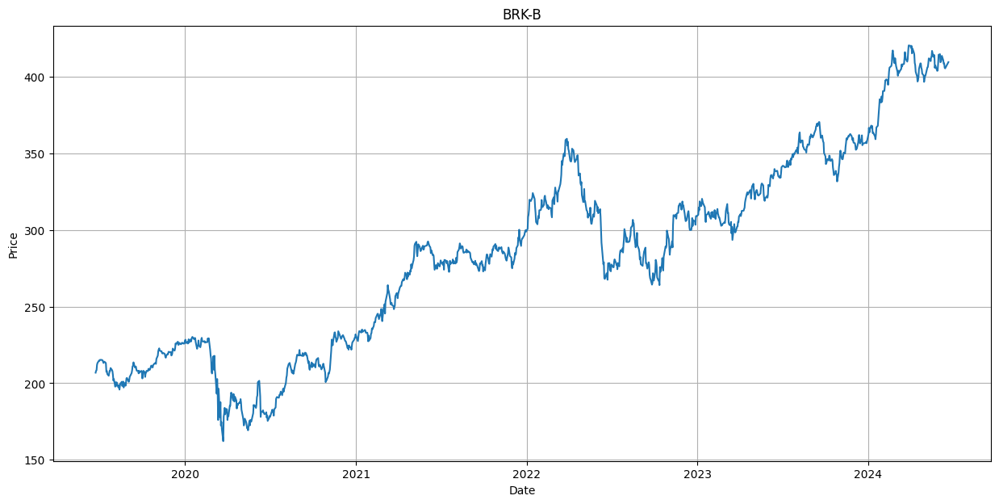

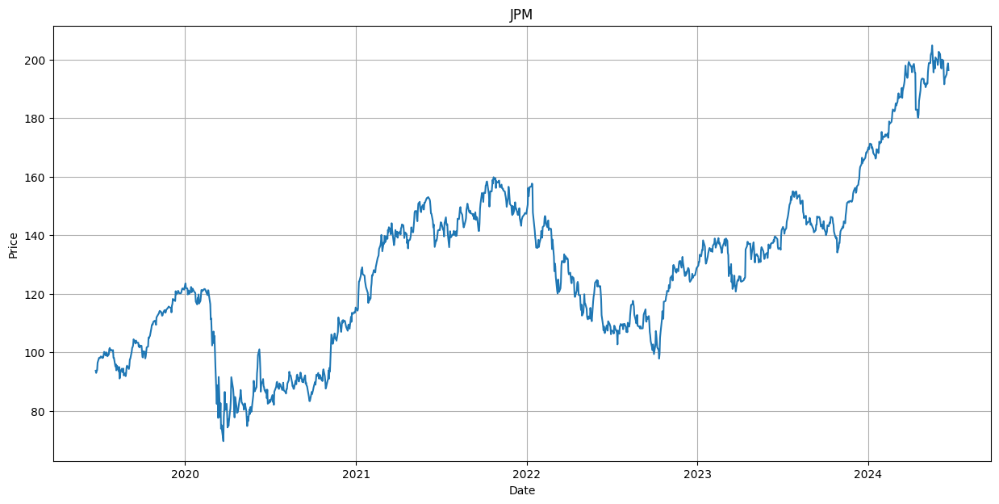

In [9]:
for i in sp500_list:
    plot_stock(i)

### Moving Averages in Financial Analysis

**Moving averages** are statistical indicators used in financial analysis to smooth out price data by creating a constantly updated average price. They help traders and analysts identify trends by filtering out the day-to-day price fluctuations.

   - **Calculation**: Calculated by averaging a set of prices over a specified number of periods.
   - **Mathematical Representation**: $$ \text{SMA} = \frac{\text{Sum of Prices over Period}}{\text{Number of Periods}} $$
   - **Use**: Provides a clear, average price trend over a specified time frame.

#### **Exponential Moving Average (EMA)**:
   - **Calculation**: Gives more weight to recent prices, making it more responsive to recent price changes compared to SMA.
   - **Mathematical Representation**: $$ \text{EMA}_t = \alpha \times \text{Price}_t + (1 - \alpha) \times \text{EMA}_{t-1} $$
     - Where $ \alpha $ is the smoothing factor.
   - **Use**: Reacts quicker to price changes, useful for short-term trading strategies.


#### Applications of Moving Averages:

- **Trend Identification**: Moving averages help identify the direction of the trend (upward, downward, or sideways).
- **Support and Resistance Levels**: They act as dynamic support and resistance levels, indicating potential buy or sell points.
- **Crossovers**: Signals such as the crossover of short-term and long-term moving averages can indicate potential changes in trend.
- **Volatility Smoothing**: Helps smooth out price volatility, providing a clearer picture of the underlying trend.
- **Trading Strategies**: Forms the basis for various trading strategies like trend following and mean reversion.

#### Interpretation:

- **Golden Cross**: When a short-term moving average crosses above a long-term moving average, suggesting bullish momentum.
- **Death Cross**: Conversely, when a short-term moving average crosses below a long-term moving average, signaling bearish momentum.

#### Considerations:

- **Period Selection**: The choice of moving average period (e.g., 10 days, 20 days) influences the sensitivity and responsiveness of the indicator.
- **Confirmation**: Moving averages are often used in conjunction with other technical indicators to confirm signals and reduce false signals.
- **Backtesting**: It’s essential to backtest moving average strategies on historical data to evaluate their effectiveness before applying them in real-time trading.

In [10]:
Moving_Average_Periods = [10, 20, 30]

for i in Moving_Average_Periods:

    ma_str = "MA: {}".format(i)

    for stock in sp500_list:

        globals()[stock][ma_str] = globals()[
            stock]['Adj Close'].rolling(i).mean()

## PLot the MA

In [11]:
def plot_graphic(stock):
    plt.figure(figsize=(15, 6))

    plt.plot(globals()[stock]['Close'])

    for ma in Moving_Average_Periods:
        ma_str = "MA: {}".format(ma)
        plt.plot(globals()[stock][ma_str])

    plt.title(stock)
    plt.xlabel('Date')
    plt.ylabel('Price')

    plt.legend(('Adj Close', 'MA: 10', 'MA: 20', 'MA:30'))
    plt.grid()
    plt.show()

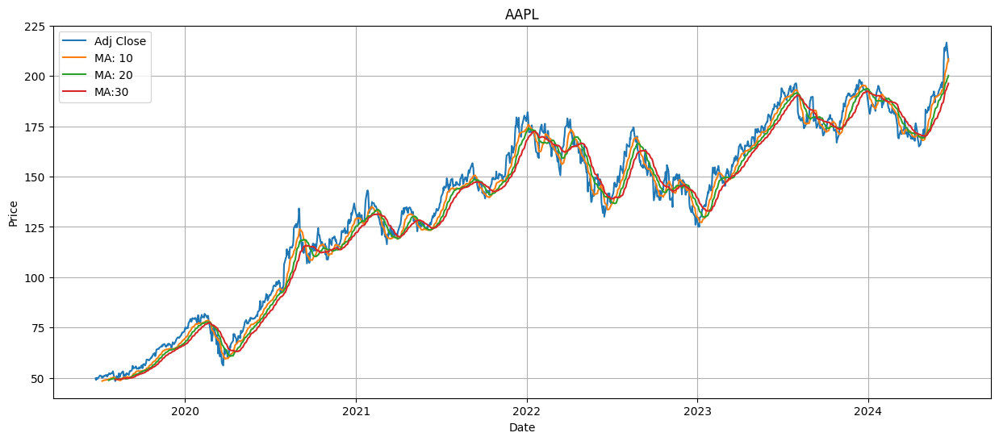

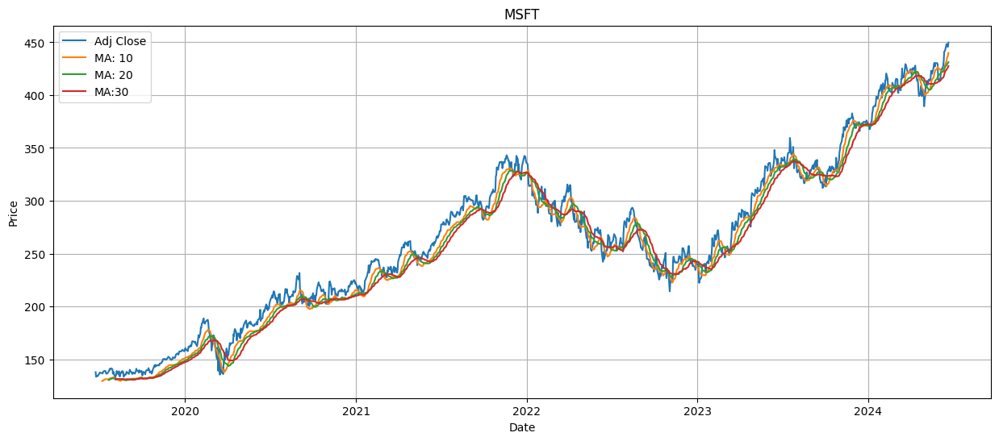

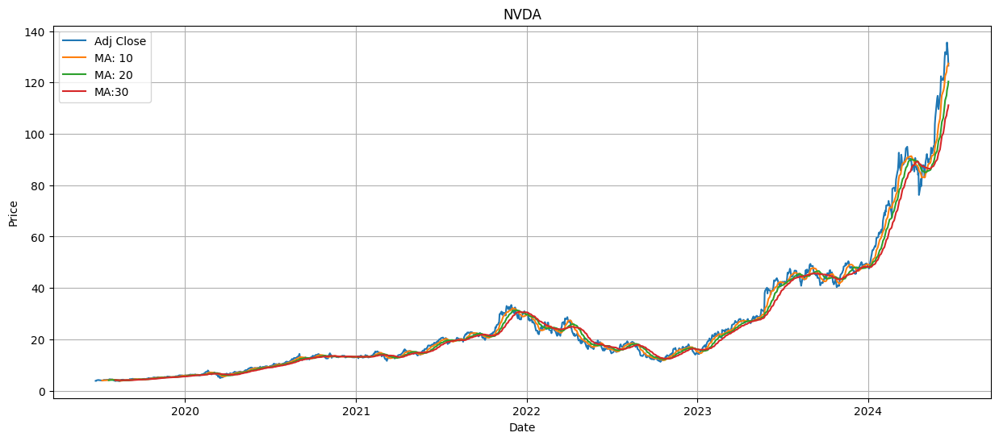

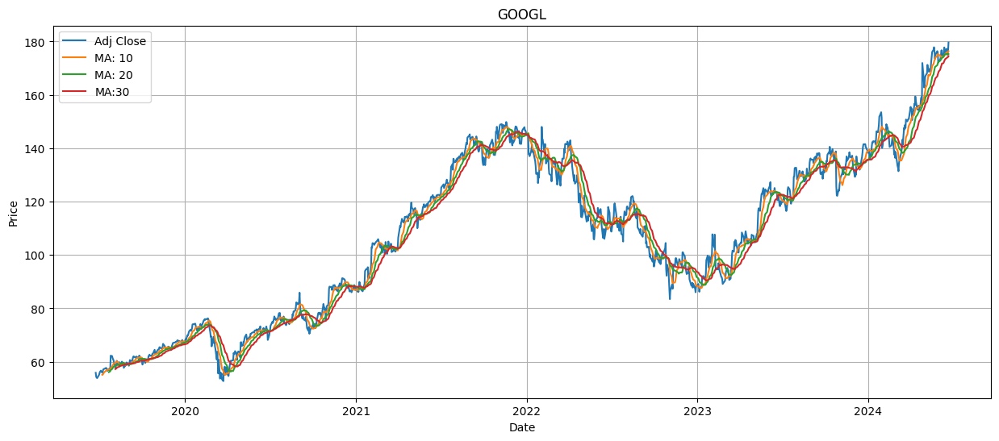

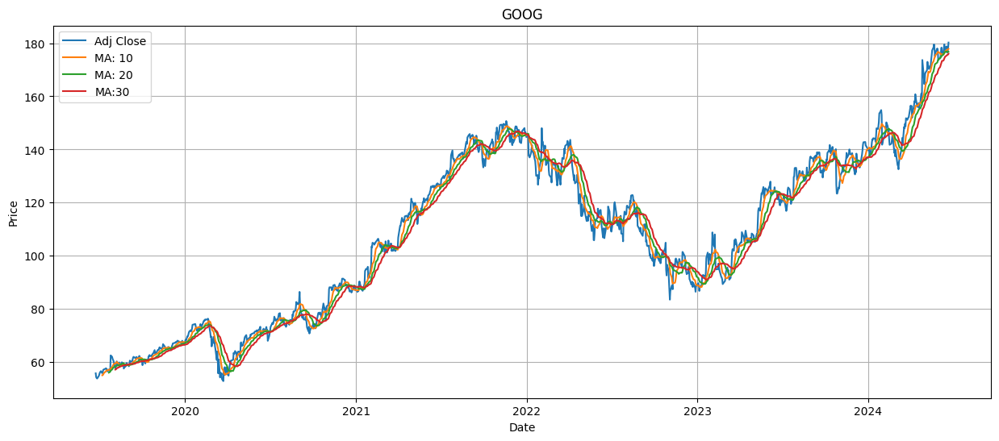

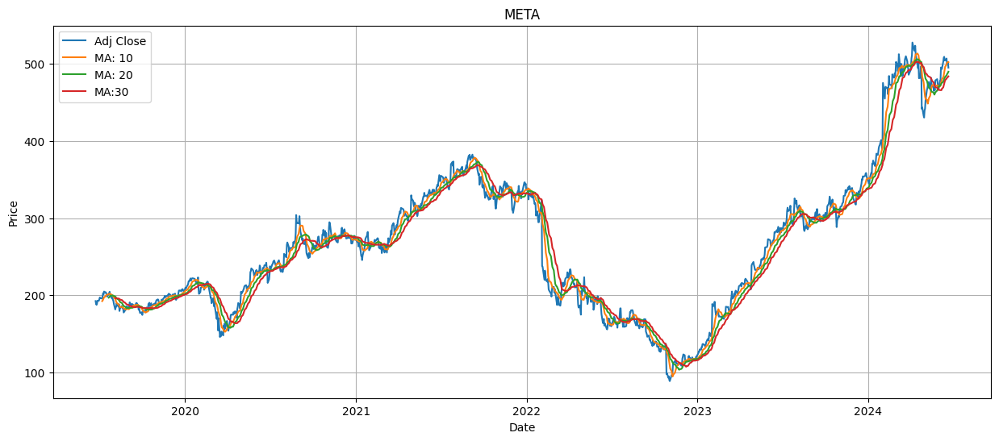

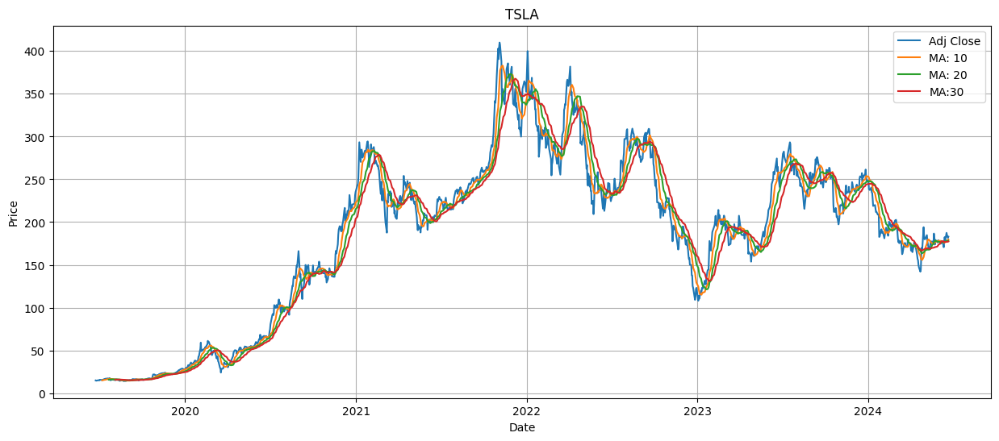

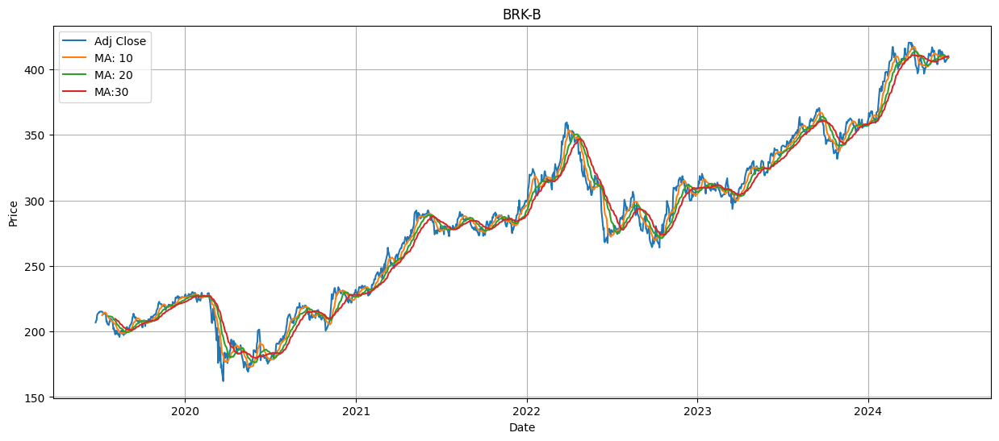

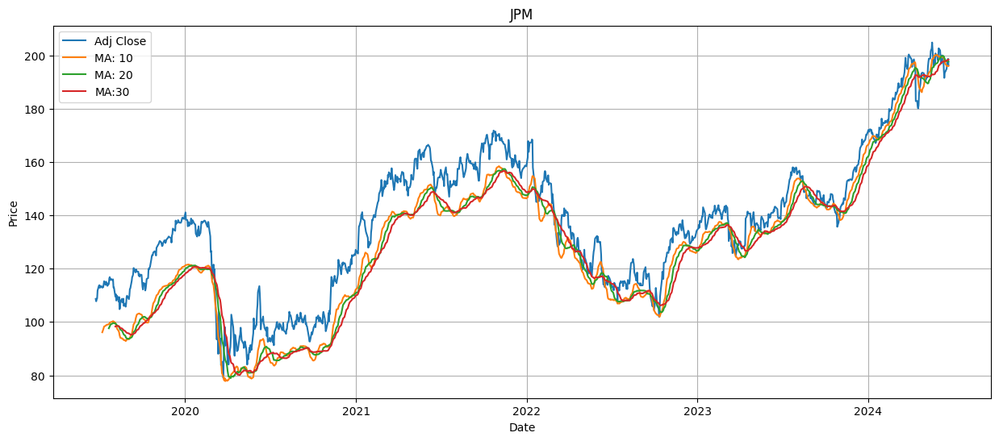

In [12]:
for stock in sp500_list:
    plot_graphic(stock)

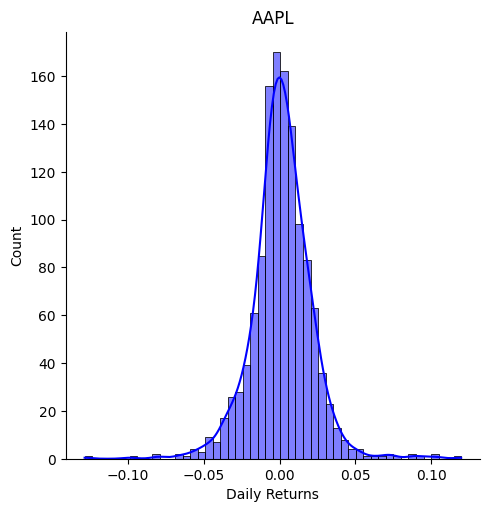

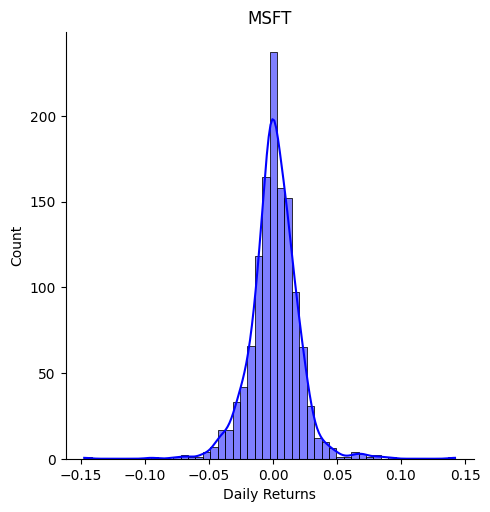

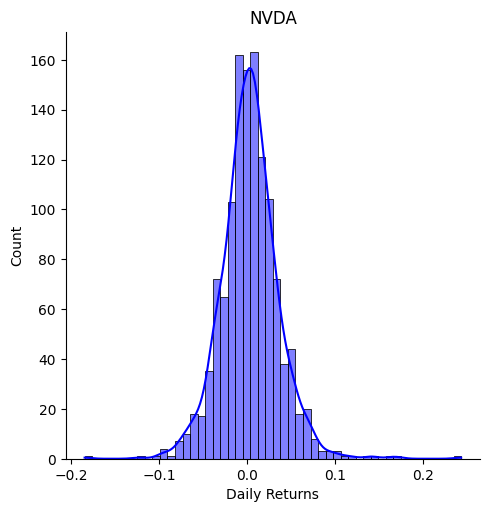

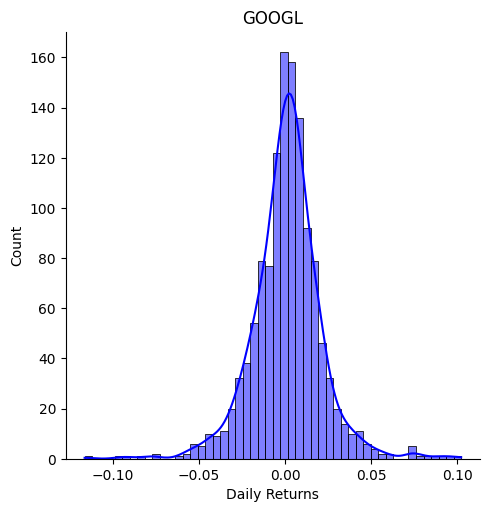

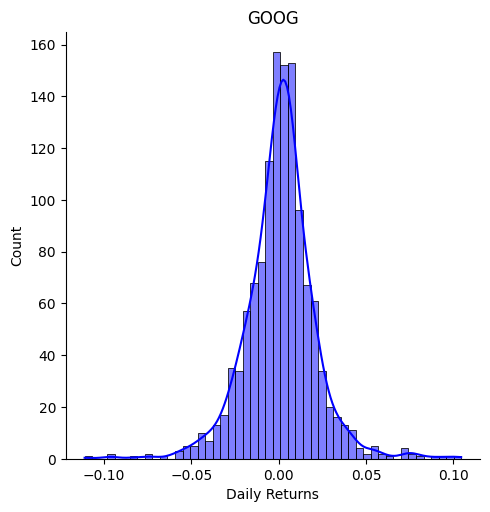

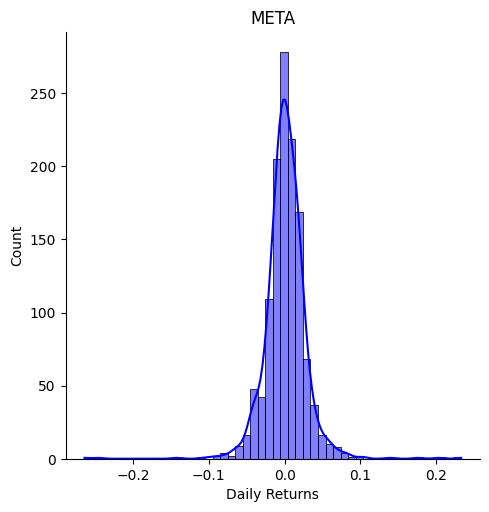

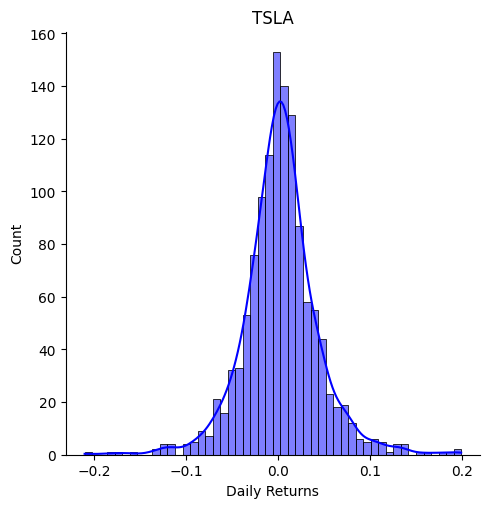

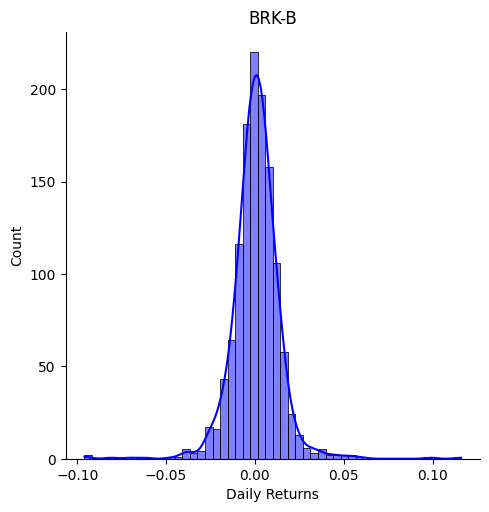

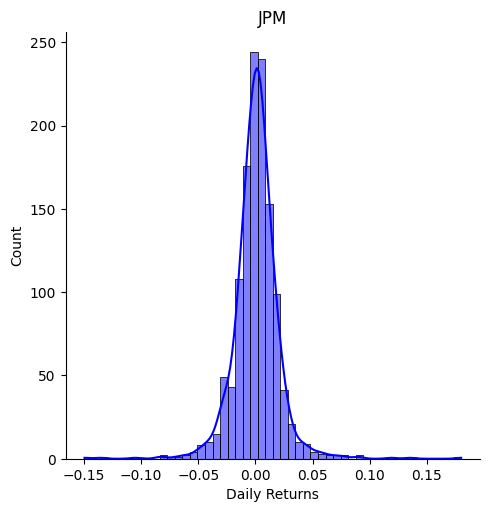

In [13]:
# Calculate returns and draw distribution

for stock in sp500_list:

    globals()[stock]['Daily Returns'] = globals()[
        stock]['Adj Close'].pct_change()

    sns.displot(globals()[stock]['Daily Returns'].dropna(),
                bins=50, color='blue', kde=True)

    plt.title(stock)
    plt.show()


#### `display_first_60_rows(stock)`

- **Purpose**: Displays the first 60 rows of data for a given stock.
- **Insights**: Provides an initial view of the dataset, showcasing early trends and fluctuations in stock prices and volumes.
- **Use**: Helps analysts and traders get a quick overview of recent stock performance.

#### `plot_volume(stock, stock_name)`

- **Purpose**: Plots the volume of trades over time for a given stock.
- **Insights**: Visualizes how trading volume fluctuates over different periods.
- **Use**: Helps in understanding market activity and liquidity trends.
- **Statistical Consideration**: Volume bars provide insight into the intensity of trading, which can indicate interest and potential price movements.

#### `plot_distribution(stock)`

- **Purpose**: Creates a histogram of the adjusted close prices for a stock, along with mean, median, and mode indicators.
- **Insights**: Illustrates the distribution of prices and identifies central tendency measures.
- **Use**: Allows for understanding the typical price range and potential outliers.
- **displays**:
  - **Histogram**: Shows the frequency distribution of prices.
  - **Mean**: Represents the average price.
  - **Median**: Represents the middle value of the dataset.
  - **Mode**: Represents the most frequently occurring price.

In [14]:
def display_last_few_rows(stock):

    cm = sns.light_palette("blue", as_cmap=True)
    display(stock.tail(10).style.background_gradient(cmap=cm))


def plot_volume(stock, stock_name):
    fig = px.bar(stock, x=stock.index, y='Volume')
    fig.update_layout(title=stock_name, barmode='stack', font_color="black")
    fig.show()


def plot_distribution(stock):
    f, ax1 = plt.subplots(1, 1, figsize=(14, 5))
    v_dist_1 = stock["Adj Close"].values
    sns.histplot(v_dist_1, ax=ax1, kde=True)
    mean = stock["Adj Close"].mean()
    median = stock["Adj Close"].median()
    mode = stock["Adj Close"].mode().values[0]
    ax1.axvline(mean, color='r', linestyle='--', label="Mean")
    ax1.axvline(median, color='g', linestyle='-', label="Median")
    ax1.axvline(mode, color='b', linestyle='-', label="Mode")
    ax1.legend()
    plt.show()

AAPL


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns
Date,,,,,,,,,,
2024-06-07 00:00:00,194.649994,196.940002,194.139999,196.889999,196.889999,53103900,192.941998,190.838998,186.154737,0.012392
2024-06-10 00:00:00,196.899994,197.300003,192.149994,193.119995,193.119995,97262100,193.255998,191.342498,186.956381,-0.019148
2024-06-11 00:00:00,193.649994,207.160004,193.630005,207.149994,207.149994,172373300,194.971997,192.385998,188.085882,0.072649
2024-06-12 00:00:00,207.369995,220.199997,206.899994,213.070007,213.070007,198134300,197.249998,193.667999,189.518239,0.028578
2024-06-13 00:00:00,214.740005,216.750000,211.600006,214.240005,214.240005,97862700,199.545000,194.893999,191.023883,0.005491
2024-06-14 00:00:00,213.850006,215.169998,211.300003,212.490005,212.490005,70122700,201.569000,196.026499,192.347029,-0.008168
2024-06-17 00:00:00,213.369995,218.949997,212.720001,216.669998,216.669998,93728300,203.833000,197.366499,193.464975,0.019671
2024-06-18 00:00:00,217.589996,218.630005,213.000000,214.289993,214.289993,79943300,205.826999,198.528999,194.559179,-0.010984
2024-06-20 00:00:00,213.929993,214.240005,208.850006,209.679993,209.679993,86172500,207.207999,199.395499,195.476748,-0.021513


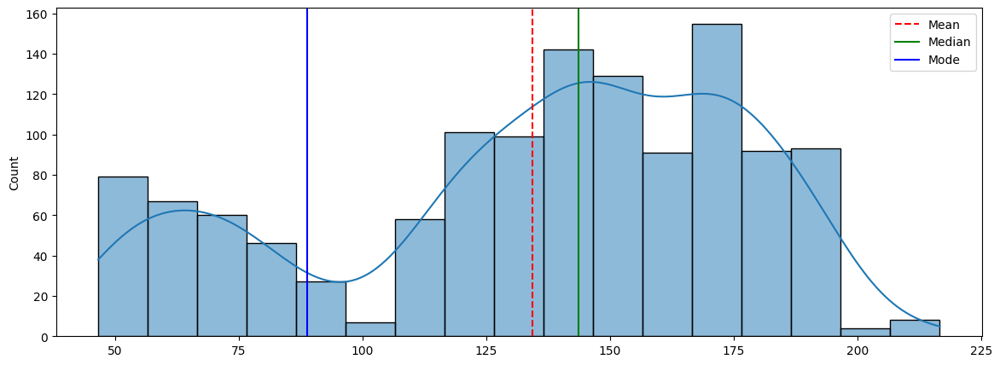

MSFT


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns
Date,,,,,,,,,,
2024-06-07 00:00:00,426.200012,426.279999,423.000000,423.850006,423.850006,13621700,422.142004,422.018918,415.872630,-0.001578
2024-06-10 00:00:00,424.700012,428.079987,423.890015,427.869995,427.869995,14003000,421.913004,422.712755,416.615348,0.009484
2024-06-11 00:00:00,425.480011,432.820007,425.250000,432.679993,432.679993,14551100,422.149002,423.698000,417.653823,0.011242
2024-06-12 00:00:00,435.320007,443.399994,433.250000,441.059998,441.059998,22366200,423.338000,424.960500,419.401523,0.019368
2024-06-13 00:00:00,440.850006,443.390015,439.369995,441.579987,441.579987,15960600,426.028998,425.885500,420.979892,0.001179
2024-06-14 00:00:00,438.279999,443.140015,436.720001,442.570007,442.570007,13582000,428.772998,426.964500,422.494769,0.002242
2024-06-17 00:00:00,442.589996,450.940002,440.720001,448.369995,448.369995,20790000,432.257999,428.372501,423.909508,0.013105
2024-06-18 00:00:00,449.709991,450.140015,444.890015,446.339996,446.339996,17112500,435.284998,429.422501,425.027660,-0.004528
2024-06-20 00:00:00,446.299988,446.529999,441.269989,445.700012,445.700012,19877400,437.453998,430.255501,426.264227,-0.001434


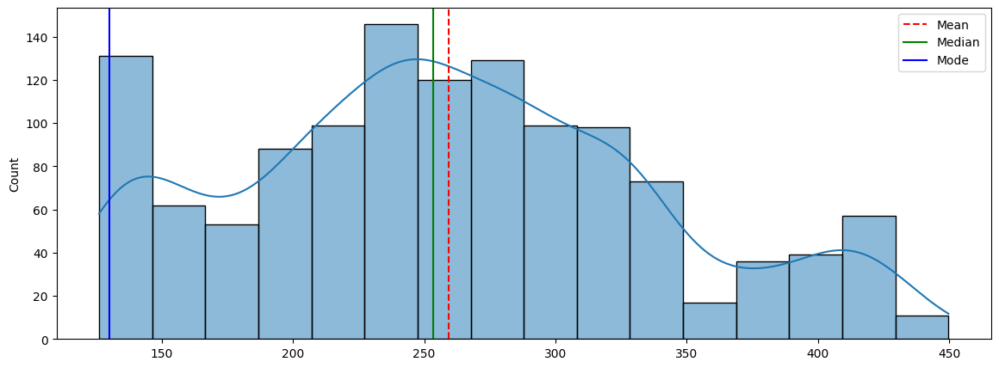

NVDA


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns
Date,,,,,,,,,,
2024-06-07 00:00:00,119.769997,121.692001,118.022003,120.888000,120.878075,412386000,115.099646,104.646754,99.141890,-0.000909
2024-06-10 00:00:00,120.370003,123.099998,117.010002,121.790001,121.779999,314162700,116.631620,106.242223,100.276964,0.007461
2024-06-11 00:00:00,121.769997,122.870003,118.739998,120.910004,120.910004,222551200,117.333456,107.768145,101.382304,-0.007144
2024-06-12 00:00:00,123.059998,126.879997,122.570000,125.199997,125.199997,299595000,118.371899,109.460720,102.675807,0.035481
2024-06-13 00:00:00,129.389999,129.800003,127.160004,129.610001,129.610001,260704500,120.283807,111.210109,104.228334,0.035224
2024-06-14 00:00:00,129.960007,132.839996,128.320007,131.880005,131.880005,309320400,122.509407,113.086546,105.764003,0.017514
2024-06-17 00:00:00,132.990005,133.729996,129.580002,130.979996,130.979996,288504400,124.108351,115.011976,107.170612,-0.006824
2024-06-18 00:00:00,131.139999,136.330002,130.690002,135.580002,135.580002,294335100,126.023608,117.052365,108.618865,0.035120
2024-06-20 00:00:00,139.800003,140.759995,129.520004,130.779999,130.779999,517768400,126.858614,118.822457,109.959979,-0.035403


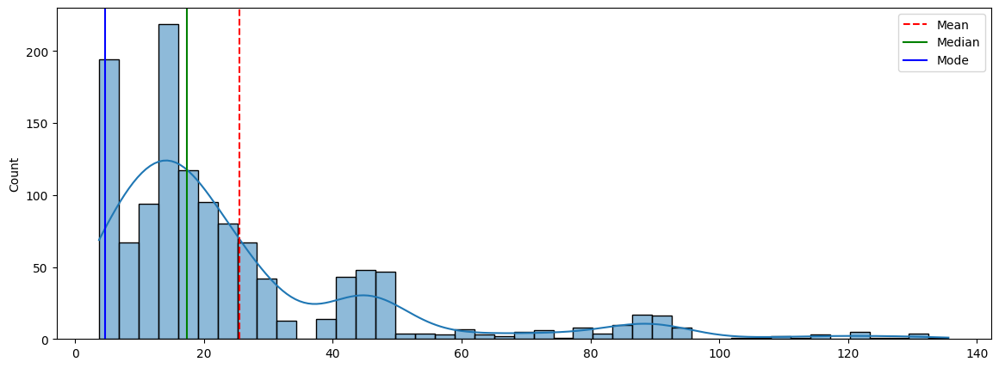

GOOGL


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns
Date,,,,,,,,,,
2024-06-07 00:00:00,177.050003,177.869995,174.300003,174.460007,174.260010,19661400,174.345903,173.852470,171.747220,-0.012844
2024-06-10 00:00:00,174.970001,177.059998,172.759995,175.009995,175.009995,23779200,174.367963,174.180137,171.855791,0.004304
2024-06-11 00:00:00,176.220001,176.839996,173.770004,176.619995,176.619995,21540600,174.410185,174.563831,172.211140,0.009199
2024-06-12 00:00:00,178.250000,180.410004,176.110001,177.789993,177.789993,27864700,174.619350,174.946095,172.717693,0.006624
2024-06-13 00:00:00,176.110001,176.740005,174.880005,175.160004,175.160004,20913300,174.944080,175.088483,173.100622,-0.014793
2024-06-14 00:00:00,174.220001,177.059998,174.149994,176.789993,176.789993,18063600,175.392854,175.228967,173.445988,0.009306
2024-06-17 00:00:00,175.460007,178.360001,174.809998,177.240005,177.240005,19618500,175.819707,175.298058,173.785713,0.002545
2024-06-18 00:00:00,177.139999,177.389999,174.100006,175.089996,175.089996,21869900,175.969630,175.216699,174.025136,-0.012130
2024-06-20 00:00:00,175.369995,177.289993,174.990005,176.300003,176.300003,20160100,176.078738,175.149393,174.200013,0.006911


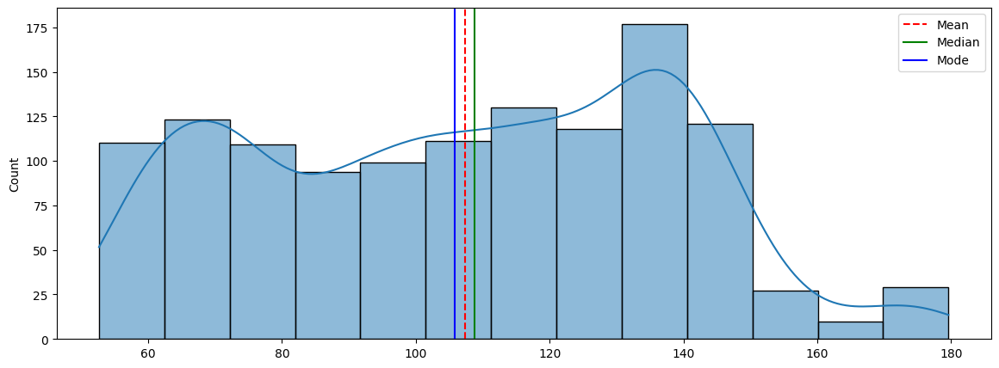

GOOG


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns
Date,,,,,,,,,,
2024-06-07 00:00:00,178.460007,179.419998,175.789993,175.949997,175.750000,14716300,175.818927,175.348959,173.328427,-0.013457
2024-06-10 00:00:00,176.449997,178.470001,174.380005,176.630005,176.630005,17122200,175.868970,175.675638,173.433008,0.005007
2024-06-11 00:00:00,177.720001,178.389999,175.440002,178.190002,178.190002,14402400,175.906204,176.049851,173.782369,0.008832
2024-06-12 00:00:00,179.750000,182.080002,177.779999,179.559998,179.559998,18600400,176.142369,176.441122,174.285941,0.007688
2024-06-13 00:00:00,177.839996,178.509995,176.660004,176.740005,176.740005,15956900,176.480098,176.594005,174.664547,-0.015705
2024-06-14 00:00:00,175.852005,178.729996,175.852005,178.369995,178.369995,12361600,176.940871,176.750975,175.001263,0.009223
2024-06-17 00:00:00,176.979996,179.919998,176.490005,178.779999,178.779999,15272900,177.396696,176.835551,175.333999,0.002299
2024-06-18 00:00:00,178.789993,178.910004,175.619995,176.449997,176.449997,15640300,177.548602,176.745193,175.561100,-0.013033
2024-06-20 00:00:00,176.710007,178.740005,176.460007,177.710007,177.710007,16753200,177.632729,176.663898,175.725321,0.007141


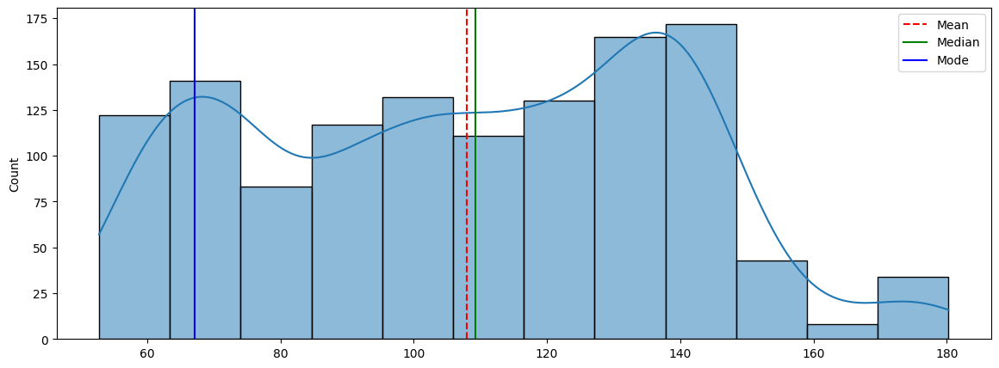

META


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns
Date,,,,,,,,,,
2024-06-07 00:00:00,495.910004,498.910004,490.170013,492.959991,492.471039,9380700,479.787634,475.148744,467.311358,-0.001620
2024-06-10 00:00:00,493.859985,502.660004,493.410004,502.600006,502.101501,11236900,482.223218,476.467435,469.286397,0.019555
2024-06-11 00:00:00,500.160004,507.600006,498.269989,507.470001,506.966644,9673700,484.975482,478.438477,471.778923,0.009690
2024-06-12 00:00:00,513.989990,514.010010,504.470001,508.839996,508.335297,11983200,488.420065,480.286142,474.398654,0.002700
2024-06-13 00:00:00,505.709991,509.359985,501.359985,504.100006,503.600006,9954600,492.121393,481.413023,476.560176,-0.009315
2024-06-14 00:00:00,502.649994,507.149994,500.750000,504.160004,504.160004,10243300,495.900699,482.982993,478.657445,0.001112
2024-06-17 00:00:00,501.670013,510.750000,496.010010,506.630005,506.630005,11266600,498.862061,484.742397,480.494722,0.004899
2024-06-18 00:00:00,504.559998,506.000000,495.019989,499.489990,499.489990,13060400,501.159372,486.298148,481.637120,-0.014093
2024-06-20 00:00:00,502.000000,503.670013,496.769989,501.700012,501.700012,11801200,501.872476,488.174690,482.767935,0.004425


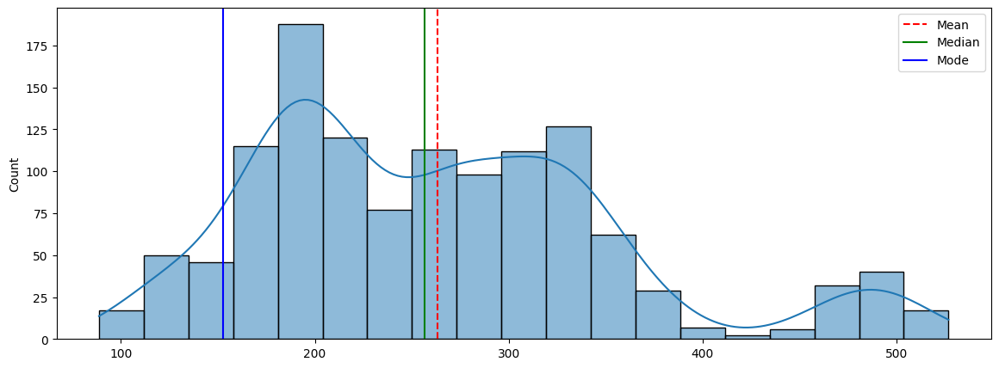

TSLA


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns
Date,,,,,,,,,,
2024-06-07 00:00:00,176.130005,179.350006,175.580002,177.479996,177.479996,56244900,177.053000,176.506501,177.540000,-0.002585
2024-06-10 00:00:00,176.059998,178.570007,173.169998,173.789993,173.789993,50869700,176.507999,176.772501,177.723334,-0.020791
2024-06-11 00:00:00,173.919998,174.750000,167.410004,170.660004,170.660004,64761900,175.898999,176.711001,176.943667,-0.018010
2024-06-12 00:00:00,171.119995,180.550003,169.800003,177.289993,177.289993,90389400,176.008998,176.698000,176.744000,0.038849
2024-06-13 00:00:00,188.389999,191.080002,181.229996,182.470001,182.470001,118984100,176.376999,177.122000,176.826667,0.029218
2024-06-14 00:00:00,185.800003,186.000000,176.919998,178.009995,178.009995,82038200,176.369998,177.280500,176.760000,-0.024442
2024-06-17 00:00:00,177.919998,188.809998,177.000000,187.440002,187.440002,109786100,177.484999,177.779500,176.968333,0.052975
2024-06-18 00:00:00,186.559998,187.199997,182.369995,184.860001,184.860001,68982300,178.493999,178.275000,176.971667,-0.013764
2024-06-20 00:00:00,184.679993,185.210007,179.660004,181.570007,181.570007,55893100,179.150999,178.023500,177.097001,-0.017797


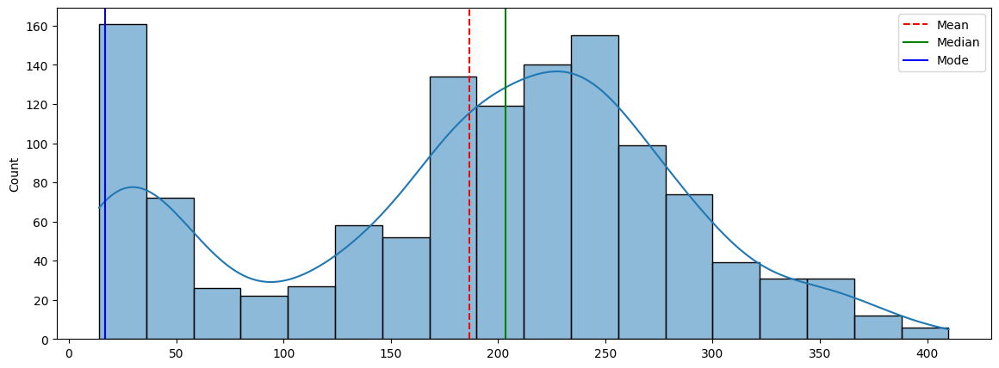

BRK-B


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns
Date,,,,,,,,,,
2024-06-07 00:00:00,411.279999,415.880005,409.850006,413.720001,413.720001,2942100,409.737997,411.047498,408.234666,0.006422
2024-06-10 00:00:00,413.339996,413.940002,409.269989,410.809998,410.809998,2667300,410.077997,410.985498,408.524999,-0.007034
2024-06-11 00:00:00,408.880005,408.910004,406.109985,408.500000,408.500000,3605900,410.537997,410.849498,408.776333,-0.005623
2024-06-12 00:00:00,411.089996,411.890015,407.160004,408.769989,408.769989,3551900,411.005997,410.775998,409.177665,0.000661
2024-06-13 00:00:00,407.630005,408.000000,403.570007,405.920013,405.920013,4563300,410.737000,410.433998,409.422333,-0.006972
2024-06-14 00:00:00,404.899994,406.339996,403.329987,405.540009,405.540009,2768600,409.851001,410.054999,409.587000,-0.000936
2024-06-17 00:00:00,405.179993,407.820007,403.549988,407.320007,407.320007,3406500,409.104001,409.573999,409.802000,0.004389
2024-06-18 00:00:00,406.750000,408.500000,405.279999,407.950012,407.950012,4005300,408.946002,409.321500,409.903000,0.001547
2024-06-20 00:00:00,407.250000,411.000000,404.049988,409.149994,409.149994,4844700,408.876001,409.060500,410.003333,0.002941


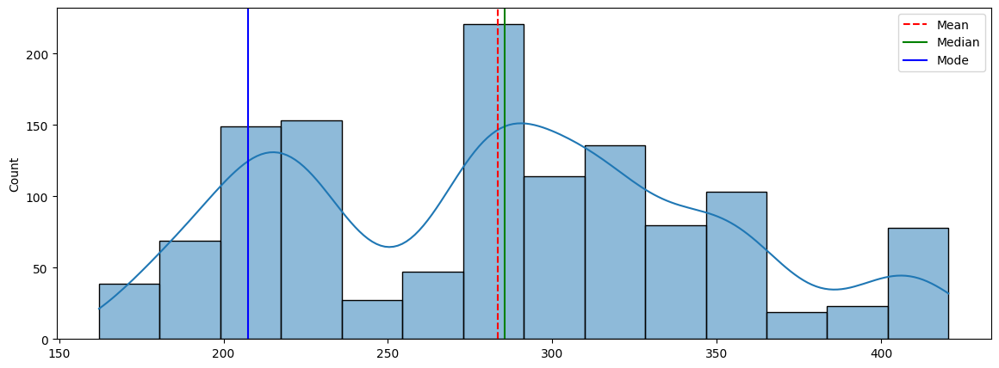

JPM


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns
Date,,,,,,,,,,
2024-06-07 00:00:00,197.429993,200.919998,197.009995,199.949997,199.949997,6964500,199.538002,199.704501,197.451000,0.015438
2024-06-10 00:00:00,199.240005,200.839996,198.440002,199.610001,199.610001,6071200,199.428001,199.746500,197.655000,-0.001700
2024-06-11 00:00:00,197.910004,197.940002,193.600006,194.360001,194.360001,9235300,198.914001,199.528001,197.691000,-0.026301
2024-06-12 00:00:00,196.000000,196.720001,191.309998,191.529999,191.529999,12751300,198.256001,199.029001,197.684000,-0.014561
2024-06-13 00:00:00,192.320007,194.580002,190.880005,193.660004,193.660004,8587800,197.689001,198.606501,197.744000,0.011121
2024-06-14 00:00:00,191.449997,194.860001,191.419998,193.779999,193.779999,6874000,196.804001,198.172001,197.814667,0.000620
2024-06-17 00:00:00,193.479996,195.580002,192.639999,194.979996,194.979996,8725400,196.120000,197.681501,197.963667,0.006193
2024-06-18 00:00:00,194.600006,197.960007,194.130005,197.000000,197.000000,9023000,195.903999,197.752501,198.130333,0.010360
2024-06-20 00:00:00,196.389999,199.449997,196.110001,198.669998,198.669998,8731100,196.045000,197.710001,198.361000,0.008477


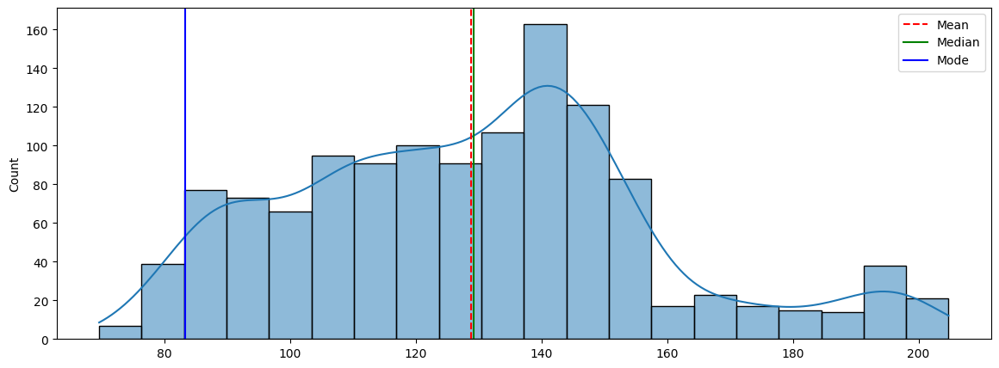

In [15]:
for stock in sp500_list:
    stock_var = globals()[stock]
    print(stock)
    display_last_few_rows(stock_var)
    plot_volume(stock_var, stock)
    plot_distribution(stock_var)

# Calculate features and technical indicators for each stock.

* Garman-Klass Volatility
* RSI
* Bollinger Bands
* ATR
* MACD
* Dollar Volume

#### `compute_atr(stock_data)`

- **Purpose**: Computes the Average True Range (ATR) for a given stock.
- **Insights**: ATR measures market volatility by calculating the average of true price ranges over a specified period.
- **Use**: Helps traders assess market volatility levels and potential price movements.
- **Statistical Insight**:
  - **Standardization**: Subtracts the mean and divides by the standard deviation to normalize the ATR values.
  - **Normalization**: Ensures ATR values are comparable across different stocks and time periods.

####  `compute_macd(close)`

- **Purpose**: Computes the Moving Average Convergence Divergence (MACD) for a given stock’s closing prices.
- **Insights**: MACD identifies changes in the strength, direction, momentum, and duration of a trend in a stock's price.
- **Use**: Signals potential buy or sell opportunities based on MACD line crossovers.
- **Statistical Insight**:
  - **Normalization**: Subtracts the mean and divides by the standard deviation to standardize MACD values.
  - **Comparability**: Facilitates comparison of MACD values across different stocks and time frames.

#### `calculate_returns`

- **Purpose**: This function computes various lagged returns for a given DataFrame of stock data, incorporating outlier handling techniques:

- **Outlier Cutoff**: Sets a threshold (`0.005`) to clip extreme returns, ensuring more robust calculations.
  
- **Lags**: Calculates returns over multiple periods (`1, 2, 3, 6, 9, 12 months`), capturing short-term to longer-term performance.
  
- **Return Calculation**:
  - **Percentage Change**: Computes the percentage change in adjusted close prices over each lag period.
  - **Clipping**: Clips returns at quantiles (`outlier_cutoff` and `1 - outlier_cutoff`), mitigating the impact of extreme values.
  - **Adjustment**: Adjusts returns by adding 1, taking the power of the reciprocal of the lag period, and subtracting 1.
  
- **Risk Management**: Clipping outliers helps in managing risk by reducing the impact of extreme price movements.
  
- **Performance Evaluation**: Computes returns over different lag periods, facilitating analysis of short-term and long-term stock performance.
  
- **Enhanced Decision-Making**: Provides insights into historical returns, aiding in investment strategy formulation and risk assessment.


In [16]:
def compute_atr(stock_data):
    atr = pandas_ta.atr(high=stock_data["High"],
                        low=stock_data['Low'],
                        close=stock_data['Adj Close'],
                        length=14)
    return atr.sub(atr.mean()).div(atr.std())


def compute_macd(close):
    macd = pandas_ta.macd(close=close, length=14).iloc[:, 0]
    return macd.sub(macd.mean()).div(macd.std())


def calculate_returns(df):
    outlier_cutoff = 0.005
    lags = [1, 2, 3, 6, 9, 12]

    for lag in lags:
        column_name = f'return_{lag}m'
        returns = df['Adj Close'].pct_change(lag)

        # Clip outliers based on quantiles
        lower_cutoff = returns.quantile(outlier_cutoff)
        upper_cutoff = returns.quantile(1 - outlier_cutoff)
        clipped_returns = returns.clip(lower=lower_cutoff, upper=upper_cutoff)

        # Calculate transformed returns
        transformed_returns = clipped_returns.add(1).pow(1 / lag).sub(1)

        df[column_name] = transformed_returns

    return df

- **Garman-Klass Volatility**: Calculates volatility using the Garman-Klass formula, which considers the logarithmic differences between high, low, adjusted close, and open prices.
  
- **Relative Strength Index (RSI)**: Measures the speed and change of price movements, indicating overbought or oversold conditions in a stock.
  
- **Bollinger Bands (BB)**:
  - **Lower Band (bb_low)**: Represents the lower boundary of expected price movements.
  - **Middle Band (bb_mid)**: Represents the moving average of prices.
  - **Upper Band (bb_high)**: Represents the upper boundary of expected price movements.
  
- **Average True Range (ATR)**: Measures volatility by analyzing the range between a stock's high and low prices.
  
- **Moving Average Convergence Divergence (MACD)**: Identifies changes in momentum, direction, and duration of a trend in a stock's price.
  
- **Dollar Volume**: Calculates the total value of stocks traded over a period, adjusted for stock splits and dividends.

### Insights and Usage

- **Volatility Measurement**: Garman-Klass, ATR, and Bollinger Bands help assess price volatility, indicating potential risks and opportunities.
  
- **Momentum Indicators**: RSI and MACD provide insights into the strength and direction of price trends, aiding in decision-making for buying or selling stocks.

In [17]:
for stock in sp500_list:

    globals()[stock]['garman_klass_vol'] = ((np.log(globals()[stock]['High'])-np.log(globals()[stock]['Low']))**2)/2-(
        2*np.log(2)-1)*((np.log(globals()[stock]['Adj Close'])-np.log(globals()[stock]['Open']))**2)

    # globals()[stock]['rsi'] = globals()[stock]['Adj Close'].transform(lambda x: pandas_ta.rsi(x, length=14))

    globals()[stock]['bb_low'] = globals()[stock]['Adj Close'].transform(
        lambda x: pandas_ta.bbands(close=np.log1p(x), length=14).iloc[:, 0])

    globals()[stock]['bb_mid'] = globals()[stock]['Adj Close'].transform(
        lambda x: pandas_ta.bbands(close=np.log1p(x), length=14).iloc[:, 1])

    globals()[stock]['bb_high'] = globals()[stock]['Adj Close'].transform(
        lambda x: pandas_ta.bbands(close=np.log1p(x), length=14).iloc[:, 2])

    globals()[stock]['atr'] = compute_atr(globals()[stock])

    globals()[stock]['macd'] = compute_macd(globals()[stock]['Adj Close'])

    globals()[stock]['dollar_volume'] = (globals()[stock]
                                         ['Adj Close']*globals()[stock]['Volume'])/1e6

    globals()[stock] = calculate_returns(globals()[stock])

In [18]:
for stock in sp500_list:

    print(stock)
    display_last_few_rows(globals()[stock])

AAPL


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns,garman_klass_vol,rsi,bb_low,bb_mid,bb_high,atr,macd,dollar_volume,return_1m,return_2m,return_3m,return_6m,return_9m,return_12m
Date,,,,,,,,,,,,,,,,,,,,,,,,
2024-06-07 00:00:00,194.649994,196.940002,194.139999,196.889999,196.889999,53103900,192.941998,190.838998,186.154737,0.012392,0.000052,None,5.236687,5.263558,5.290429,-0.999991,1.378379,10455.626839,0.012392,0.002600,0.004338,0.004821,0.003977,0.001946
2024-06-10 00:00:00,196.899994,197.300003,192.149994,193.119995,193.119995,97262100,193.255998,191.342498,186.956381,-0.019148,0.000205,None,5.237555,5.264328,5.291100,-0.836844,1.265957,18783.256277,-0.019148,-0.003503,-0.004702,0.000753,0.001817,0.000964
2024-06-11 00:00:00,193.649994,207.160004,193.630005,207.149994,207.149994,172373300,194.971997,192.385998,188.085882,0.072649,0.000527,None,5.223040,5.269596,5.316152,-0.019107,1.588238,35707.128043,0.072649,0.025724,0.021261,0.010965,0.009477,0.008618
2024-06-12 00:00:00,207.369995,220.199997,206.899994,213.070007,213.070007,198134300,197.249998,193.667999,189.518239,0.028578,0.001657,None,5.209951,5.277405,5.344859,0.684762,1.999802,42216.476752,0.028578,0.043985,0.026675,0.015445,0.012053,0.009604
2024-06-13 00:00:00,214.740005,216.750000,211.600006,214.240005,214.240005,97862700,199.545000,194.893999,191.023883,0.005491,0.000287,None,5.208238,5.287116,5.365994,0.727568,2.331593,20966.105386,0.005491,0.016969,0.032723,0.015053,0.012106,0.010061
2024-06-14 00:00:00,213.850006,215.169998,211.300003,212.490005,212.490005,70122700,201.569000,196.026499,192.347029,-0.008168,0.000149,None,5.209691,5.295074,5.380458,0.671389,2.507948,14900.372908,-0.008168,-0.001362,0.008520,0.014870,0.010149,0.009238
2024-06-17 00:00:00,213.369995,218.949997,212.720001,216.669998,216.669998,93728300,203.833000,197.366499,193.464975,0.019671,0.000326,None,5.211546,5.304414,5.397283,0.813325,2.741573,20308.110589,0.019671,0.005655,0.005601,0.016083,0.012153,0.010436
2024-06-18 00:00:00,217.589996,218.630005,213.000000,214.289993,214.289993,79943300,205.826999,198.528999,194.559179,-0.010984,0.000250,None,5.218455,5.312857,5.407259,0.882921,2.817109,17131.049220,-0.010984,0.004227,0.000078,0.017488,0.010037,0.009085
2024-06-20 00:00:00,213.929993,214.240005,208.850006,209.679993,209.679993,86172500,207.207999,199.395499,195.476748,-0.021513,0.000169,None,5.228198,5.319381,5.410564,0.933305,2.699835,18068.649169,-0.021513,-0.016263,-0.004428,0.002025,0.008397,0.006485


MSFT


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns,garman_klass_vol,rsi,bb_low,bb_mid,bb_high,atr,macd,dollar_volume,return_1m,return_2m,return_3m,return_6m,return_9m,return_12m
Date,,,,,,,,,,,,,,,,,,,,,,,,
2024-06-07 00:00:00,426.200012,426.279999,423.000000,423.850006,423.850006,13621700,422.142004,422.018918,415.872630,-0.001578,0.000018,None,6.022679,6.051535,6.080391,-0.959939,0.154173,5773.557628,-0.001578,-0.000189,0.006194,0.003656,-0.001641,-0.001014
2024-06-10 00:00:00,424.700012,428.079987,423.890015,427.869995,427.869995,14003000,421.913004,422.712755,416.615348,0.009484,0.000027,None,6.022726,6.051957,6.081189,-1.099220,0.235998,5991.463542,0.009484,0.003938,0.003025,0.005051,-0.000634,-0.000514
2024-06-11 00:00:00,425.480011,432.820007,425.250000,432.679993,432.679993,14551100,422.149002,423.698000,417.653823,0.011242,0.000047,None,6.022051,6.052560,6.083068,-1.071800,0.385994,6295.969841,0.011242,0.010363,0.006367,0.007577,0.000905,0.001102
2024-06-12 00:00:00,435.320007,443.399994,433.250000,441.059998,441.059998,22366200,423.338000,424.960500,419.401523,0.019368,0.000202,None,6.018385,6.054283,6.090182,-0.898505,0.656875,9864.836117,0.019368,0.015297,0.013355,0.009769,0.006879,0.002087
2024-06-13 00:00:00,440.850006,443.390015,439.369995,441.579987,441.579987,15960600,426.028998,425.885500,420.979892,0.001179,0.000040,None,6.015700,6.056676,6.097652,-1.052028,0.867057,7047.881534,0.001179,0.010232,0.010569,0.006790,0.006887,0.002155
2024-06-14 00:00:00,438.279999,443.140015,436.720001,442.570007,442.570007,13582000,428.772998,426.964500,422.494769,0.002242,0.000070,None,6.013408,6.058703,6.103998,-1.081950,1.036395,6010.985839,0.002242,0.001710,0.007562,0.006964,0.007572,0.002565
2024-06-17 00:00:00,442.589996,450.940002,440.720001,448.369995,448.369995,20790000,432.257999,428.372501,423.909508,0.013105,0.000198,None,6.009781,6.061631,6.113481,-0.931396,1.265019,9321.612198,0.013105,0.007659,0.005494,0.009417,0.008342,0.006533
2024-06-18 00:00:00,449.709991,450.140015,444.890015,446.339996,446.339996,17112500,435.284998,429.422501,425.027660,-0.004528,0.000047,None,6.008286,6.064427,6.120568,-1.024845,1.385745,7637.993187,-0.004528,0.004250,0.003580,0.007068,0.005719,0.006059
2024-06-20 00:00:00,446.299988,446.529999,441.269989,445.700012,445.700012,19877400,437.453998,430.255501,426.264227,-0.001434,0.000070,None,6.013836,6.069569,6.125303,-1.111149,1.447497,8859.357423,-0.001434,-0.002982,0.002352,0.004954,0.005424,0.006265


NVDA


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns,garman_klass_vol,rsi,bb_low,bb_mid,bb_high,atr,macd,dollar_volume,return_1m,return_2m,return_3m,return_6m,return_9m,return_12m
Date,,,,,,,,,,,,,,,,,,,,,,,,
2024-06-07 00:00:00,119.769997,121.692001,118.022003,120.888000,120.878075,412386000,115.099646,104.646754,99.141890,-0.000909,0.000436,None,4.533258,4.705793,4.878327,3.880126,5.130155,49848.425691,-0.000909,-0.006358,0.012583,0.015088,0.014212,0.019941
2024-06-10 00:00:00,120.370003,123.099998,117.010002,121.790001,121.779999,314162700,116.631620,106.242223,100.276964,0.007461,0.001235,None,4.563147,4.723537,4.883927,4.000605,5.200348,38258.733223,0.007461,0.003267,-0.001773,0.017681,0.007469,0.020962
2024-06-11 00:00:00,121.769997,122.870003,118.739998,120.910004,120.910004,222551200,117.333456,107.768145,101.382304,-0.007144,0.000565,None,4.600581,4.740323,4.880065,3.958749,5.145235,26908.666407,-0.007144,0.000132,-0.000215,0.008401,0.005763,0.012804
2024-06-12 00:00:00,123.059998,126.879997,122.570000,125.199997,125.199997,299595000,118.371899,109.460720,102.675807,0.035481,0.000482,None,4.651255,4.759903,4.868552,4.064200,5.267121,37509.293086,0.035481,0.013944,0.011779,0.012181,0.013983,0.013603
2024-06-13 00:00:00,129.389999,129.800003,127.160004,129.610001,129.610001,260704500,120.283807,111.210109,104.228334,0.035224,0.000210,None,4.670328,4.775636,4.880943,4.054666,5.532677,33789.910404,0.035224,0.035352,0.020988,0.009544,0.018782,0.010832
2024-06-14 00:00:00,129.960007,132.839996,128.320007,131.880005,131.880005,309320400,122.509407,113.086546,105.764003,0.017514,0.000516,None,4.685457,4.790802,4.896146,4.039537,5.793906,40793.175862,0.017514,0.026331,0.029372,0.014470,0.015343,0.011614
2024-06-17 00:00:00,132.990005,133.729996,129.580002,130.979996,130.979996,288504400,124.108351,115.011976,107.170612,-0.006824,0.000407,None,4.688950,4.800706,4.912462,3.996468,5.880105,37788.305079,-0.006824,0.005271,0.015158,0.013467,0.013172,0.014277
2024-06-18 00:00:00,131.139999,136.330002,130.690002,135.580002,135.580002,294335100,126.023608,117.052365,108.618865,0.035120,0.000464,None,4.689544,4.812485,4.935427,4.073342,6.120825,39905.953397,0.035120,0.013931,0.015124,0.018052,0.011400,0.017867
2024-06-20 00:00:00,139.800003,140.759995,129.520004,130.779999,130.779999,517768400,126.858614,118.822457,109.959979,-0.035403,0.001744,None,4.709902,4.824428,4.938954,4.583950,5.979724,67713.750720,-0.035403,-0.000764,-0.002788,0.013164,0.008685,0.010780


GOOGL


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns,garman_klass_vol,rsi,bb_low,bb_mid,bb_high,atr,macd,dollar_volume,return_1m,return_2m,return_3m,return_6m,return_9m,return_12m
Date,,,,,,,,,,,,,,,,,,,,,,,,
2024-06-07 00:00:00,177.050003,177.869995,174.300003,174.460007,174.260010,19661400,174.345903,173.852470,171.747220,-0.012844,0.000108,None,5.149793,5.169361,5.188928,0.663559,1.058032,3426.195756,-0.012844,-0.002712,0.001283,0.002263,-0.000337,-0.001602
2024-06-10 00:00:00,174.970001,177.059998,172.759995,175.009995,175.009995,23779200,174.367963,174.180137,171.855791,0.004304,0.000302,None,5.150020,5.168671,5.187322,0.744526,0.990860,4161.597661,0.004304,-0.004307,-0.000379,0.002602,-0.000751,-0.000554
2024-06-11 00:00:00,176.220001,176.839996,173.770004,176.619995,176.619995,21540600,174.410185,174.563831,172.211140,0.009199,0.000151,None,5.150894,5.168260,5.185626,0.722904,0.988885,3804.500667,0.009199,0.006749,0.000175,0.003485,0.000581,0.001558
2024-06-12 00:00:00,178.250000,180.410004,176.110001,177.789993,177.789993,27864700,174.619350,174.946095,172.717693,0.006624,0.000288,None,5.149687,5.168907,5.188126,0.799631,1.020022,4954.064826,0.006624,0.007911,0.006707,0.003992,0.003742,0.001419
2024-06-13 00:00:00,176.110001,176.740005,174.880005,175.160004,175.160004,20913300,174.944080,175.088483,173.100622,-0.014793,0.000045,None,5.150897,5.169644,5.188391,0.761480,0.921363,3663.173705,-0.014793,-0.004142,0.000286,-0.000047,0.001829,-0.000492
2024-06-14 00:00:00,174.220001,177.059998,174.149994,176.789993,176.789993,18063600,175.392854,175.228967,173.445988,0.009306,0.000054,None,5.150879,5.170452,5.190025,0.726056,0.896328,3193.463723,0.009306,-0.002816,0.000321,0.000248,0.002429,0.000516
2024-06-17 00:00:00,175.460007,178.360001,174.809998,177.240005,177.240005,19618500,175.819707,175.298058,173.785713,0.002545,0.000163,None,5.150498,5.170871,5.191244,0.743531,0.881013,3477.183048,0.002545,0.005920,-0.001032,0.002830,0.002314,0.002546
2024-06-18 00:00:00,177.139999,177.389999,174.100006,175.089996,175.089996,21869900,175.969630,175.216699,174.025136,-0.012130,0.000123,None,5.150347,5.170625,5.190902,0.739295,0.767170,3829.200711,-0.012130,-0.004820,-0.000133,0.000076,-0.000075,0.001338
2024-06-20 00:00:00,175.369995,177.289993,174.990005,176.300003,176.300003,20160100,176.078738,175.149393,174.200013,0.006911,0.000074,None,5.154461,5.172415,5.190368,0.657445,0.714823,3554.225692,0.006911,-0.002655,-0.000925,-0.000302,-0.000143,0.001590


GOOG


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns,garman_klass_vol,rsi,bb_low,bb_mid,bb_high,atr,macd,dollar_volume,return_1m,return_2m,return_3m,return_6m,return_9m,return_12m
Date,,,,,,,,,,,,,,,,,,,,,,,,
2024-06-07 00:00:00,178.460007,179.419998,175.789993,175.949997,175.750000,14716300,175.818927,175.348959,173.328427,-0.013457,0.000118,None,5.157475,5.177888,5.198301,0.665059,1.036907,2586.389725,-0.013457,-0.003168,0.001558,0.002282,-0.000240,-0.001682
2024-06-10 00:00:00,176.449997,178.470001,174.380005,176.630005,176.630005,17122200,175.868970,175.675638,173.433008,0.005007,0.000268,None,5.157698,5.177237,5.196776,0.732999,0.975684,3024.294270,0.005007,-0.004268,-0.000450,0.002732,-0.000744,-0.000549
2024-06-11 00:00:00,177.720001,178.389999,175.440002,178.190002,178.190002,14402400,175.906204,176.049851,173.782369,0.008832,0.000136,None,5.158657,5.176782,5.194906,0.704943,0.975997,2566.363691,0.008832,0.006918,0.000080,0.003761,0.000620,0.001573
2024-06-12 00:00:00,179.750000,182.080002,177.779999,179.559998,179.559998,18600400,176.142369,176.441122,174.285941,0.007688,0.000285,None,5.157305,5.177482,5.197659,0.786824,1.016808,3339.887779,0.007688,0.008260,0.007175,0.004363,0.003910,0.001609
2024-06-13 00:00:00,177.839996,178.509995,176.660004,176.740005,176.740005,15956900,176.480098,176.594005,174.664547,-0.015705,0.000039,None,5.158498,5.178241,5.197984,0.750925,0.918840,2820.222594,-0.015705,-0.004077,0.000208,-0.000121,0.001890,-0.000506
2024-06-14 00:00:00,175.852005,178.729996,175.852005,178.369995,178.369995,12361600,176.940871,176.750975,175.001263,0.009223,0.000054,None,5.158598,5.179139,5.199680,0.715831,0.893853,2204.938532,0.009223,-0.003319,0.000337,0.000208,0.002618,0.000549
2024-06-17 00:00:00,176.979996,179.919998,176.490005,178.779999,178.779999,15272900,177.396696,176.835551,175.333999,0.002299,0.000146,None,5.158268,5.179522,5.200777,0.727377,0.876818,2730.489043,0.002299,0.005755,-0.001450,0.002853,0.002421,0.002567
2024-06-18 00:00:00,178.789993,178.910004,175.619995,176.449997,176.449997,15640300,177.548602,176.745193,175.561100,-0.013033,0.000105,None,5.158048,5.179222,5.200396,0.726906,0.755010,2759.730887,-0.013033,-0.005397,-0.000547,-0.000170,-0.000263,0.001280
2024-06-20 00:00:00,176.710007,178.740005,176.460007,177.710007,177.710007,16753200,177.632729,176.663898,175.725321,0.007141,0.000070,None,5.162146,5.180981,5.199816,0.646519,0.698196,2977.211284,0.007141,-0.002997,-0.001235,-0.000449,-0.000273,0.001653


META


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns,garman_klass_vol,rsi,bb_low,bb_mid,bb_high,atr,macd,dollar_volume,return_1m,return_2m,return_3m,return_6m,return_9m,return_12m
Date,,,,,,,,,,,,,,,,,,,,,,,,
2024-06-07 00:00:00,495.910004,498.910004,490.170013,492.959991,492.471039,9380700,479.787634,475.148744,467.311358,-0.001620,0.000137,None,6.123984,6.167141,6.210298,1.413653,0.279342,4619.723074,-0.001620,-0.002123,0.011038,0.009039,0.003379,0.004944
2024-06-10 00:00:00,493.859985,502.660004,493.410004,502.600006,502.101501,11236900,482.223218,476.467435,469.286397,0.019555,0.000067,None,6.121939,6.172097,6.222256,1.366427,0.466237,5642.064362,0.019555,0.008912,0.005051,0.012381,0.005144,0.006001
2024-06-11 00:00:00,500.160004,507.600006,498.269989,507.470001,506.966644,9673700,484.975482,478.438477,471.778923,0.009690,0.000102,None,6.122908,6.178384,6.233860,1.299890,0.654991,4904.243227,0.009690,0.014610,0.009171,0.010201,0.007525,0.007169
2024-06-12 00:00:00,513.989990,514.010010,504.470001,508.839996,508.335297,11983200,488.420065,480.286142,474.398654,0.002700,0.000128,None,6.124842,6.184382,6.243921,1.243652,0.807090,6091.483527,0.002700,0.006189,0.010625,0.010831,0.009567,0.005185
2024-06-13 00:00:00,505.709991,509.359985,501.359985,504.100006,503.600006,9954600,492.121393,481.413023,476.560176,-0.009315,0.000119,None,6.131579,6.190017,6.248455,1.150758,0.865959,5013.136621,-0.009315,-0.003326,0.000994,0.003021,0.008571,0.004105
2024-06-14 00:00:00,502.649994,507.149994,500.750000,504.160004,504.160004,10243300,495.900699,482.982993,478.657445,0.001112,0.000077,None,6.133838,6.193853,6.253869,1.022243,0.905575,5164.262166,0.001112,-0.004115,-0.001849,0.003646,0.006168,0.005173
2024-06-17 00:00:00,501.670013,510.750000,496.010010,506.630005,506.630005,11266600,498.862061,484.742397,480.494722,0.004899,0.000391,None,6.136112,6.197785,6.259458,1.123169,0.949299,5707.997613,0.004899,0.003004,-0.001119,0.004735,0.006832,0.006885
2024-06-18 00:00:00,504.559998,506.000000,495.019989,499.489990,499.489990,13060400,501.159372,486.298148,481.637120,-0.014093,0.000201,None,6.142427,6.201535,6.260643,1.134223,0.896907,6523.539068,-0.014093,-0.004642,-0.002728,-0.000869,0.001101,0.005734
2024-06-20 00:00:00,502.000000,503.670013,496.769989,501.700012,501.700012,11801200,501.872476,488.174690,482.767935,0.004425,0.000095,None,6.155205,6.206707,6.258209,1.020095,0.865970,5920.662184,0.004425,-0.004877,-0.001629,-0.001739,0.001885,0.004213


TSLA


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns,garman_klass_vol,rsi,bb_low,bb_mid,bb_high,atr,macd,dollar_volume,return_1m,return_2m,return_3m,return_6m,return_9m,return_12m
Date,,,,,,,,,,,,,,,,,,,,,,,,
2024-06-07 00:00:00,176.130005,179.350006,175.580002,177.479996,177.479996,56244900,177.053000,176.506501,177.540000,-0.002585,0.000203,None,5.150756,5.184814,5.218873,-0.520519,-0.000171,9982.344612,-0.002585,0.007061,0.005142,-0.001225,-0.001096,-0.004167
2024-06-10 00:00:00,176.059998,178.570007,173.169998,173.789993,173.789993,50869700,176.507999,176.772501,177.723334,-0.020791,0.000406,None,5.149316,5.184342,5.219368,-0.539198,-0.033835,8840.644821,-0.020791,-0.011730,-0.002310,-0.004056,-0.001875,-0.002972
2024-06-11 00:00:00,173.919998,174.750000,167.410004,170.660004,170.660004,64761900,175.898999,176.711001,176.943667,-0.018010,0.000782,None,5.150014,5.177999,5.205985,-0.529933,-0.087997,11052.266091,-0.018010,-0.019402,-0.013828,-0.005395,-0.003537,-0.001489
2024-06-12 00:00:00,171.119995,180.550003,169.800003,177.289993,177.289993,90389400,176.008998,176.698000,176.744000,0.038849,0.001399,None,5.151202,5.176878,5.202555,-0.474559,-0.073272,16025.136119,0.038849,0.010019,-0.000357,0.002389,-0.000936,-0.000911
2024-06-13 00:00:00,188.389999,191.080002,181.229996,182.470001,182.470001,118984100,176.376999,177.122000,176.826667,0.029218,0.001007,None,5.150169,5.180361,5.210553,-0.381442,-0.017271,21711.028872,0.029218,0.034022,0.016379,0.006991,0.002710,0.002658
2024-06-14 00:00:00,185.800003,186.000000,176.919998,178.009995,178.009995,82038200,176.369998,177.280500,176.760000,-0.024442,0.000544,None,5.150384,5.179872,5.209359,-0.359580,-0.012864,14603.619531,-0.024442,0.002029,0.014155,0.000066,0.001079,0.000857
2024-06-17 00:00:00,177.919998,188.809998,177.000000,187.440002,187.440002,109786100,177.484999,177.779500,176.968333,0.052975,0.001036,None,5.141720,5.184043,5.226367,-0.301834,0.071086,20578.306852,0.052975,0.013527,0.018731,0.009142,0.007807,0.003945
2024-06-18 00:00:00,186.559998,187.199997,182.369995,184.860001,184.860001,68982300,178.493999,178.275000,176.971667,-0.013764,0.000309,None,5.140439,5.187455,5.234472,-0.340660,0.112628,12752.068020,-0.013764,0.019059,0.004347,0.010345,0.006109,0.003119
2024-06-20 00:00:00,184.679993,185.210007,179.660004,181.570007,181.570007,55893100,179.150999,178.023500,177.097001,-0.017797,0.000351,None,5.140478,5.188551,5.236624,-0.370129,0.114337,10148.510576,-0.017797,-0.015783,0.006622,0.010382,0.002246,0.002462


BRK-B


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns,garman_klass_vol,rsi,bb_low,bb_mid,bb_high,atr,macd,dollar_volume,return_1m,return_2m,return_3m,return_6m,return_9m,return_12m
Date,,,,,,,,,,,,,,,,,,,,,,,,
2024-06-07 00:00:00,411.279999,415.880005,409.850006,413.720001,413.720001,2942100,409.737997,411.047498,408.234666,0.006422,0.000093,None,6.001043,6.019354,6.037665,0.581504,-0.005569,1217.205616,0.006422,0.004710,0.003399,0.002074,0.001709,-0.000131
2024-06-10 00:00:00,413.339996,413.940002,409.269989,410.809998,410.809998,2667300,410.077997,410.985498,408.524999,-0.007034,0.000050,None,6.001003,6.018975,6.036948,0.545884,-0.025507,1095.753506,-0.007034,-0.000328,0.000780,-0.001449,0.001887,-0.000642
2024-06-11 00:00:00,408.880005,408.910004,406.109985,408.500000,408.500000,3605900,410.537997,410.849498,408.776333,-0.005623,0.000023,None,6.000817,6.017958,6.035100,0.514283,-0.092405,1473.010150,-0.005623,-0.006329,-0.002096,-0.002544,0.001207,0.000536
2024-06-12 00:00:00,411.089996,411.890015,407.160004,408.769989,408.769989,3551900,411.005997,410.775998,409.177665,0.000661,0.000054,None,6.000872,6.017054,6.033237,0.486413,-0.141452,1451.910124,0.000661,-0.002486,-0.004004,-0.000310,0.000044,0.000278
2024-06-13 00:00:00,407.630005,408.000000,403.570007,405.920013,405.920013,4563300,410.737000,410.433998,409.422333,-0.006972,0.000053,None,6.000893,6.017061,6.033229,0.483629,-0.241112,1852.334797,-0.006972,-0.003163,-0.003984,-0.001605,-0.002295,0.000416
2024-06-14 00:00:00,404.899994,406.339996,403.329987,405.540009,405.540009,2768600,409.851001,410.054999,409.587000,-0.000936,0.000027,None,6.000014,6.016734,6.033453,0.373422,-0.327708,1122.778068,-0.000936,-0.003959,-0.002421,-0.002259,-0.002503,0.000299
2024-06-17 00:00:00,405.179993,407.820007,403.549988,407.320007,407.320007,3406500,409.104001,409.573999,409.802000,0.004389,0.000045,None,6.001992,6.017334,6.032677,0.333008,-0.357971,1387.535605,0.004389,0.001723,-0.001184,-0.002595,-0.000601,-0.000263
2024-06-18 00:00:00,406.750000,408.500000,405.279999,407.950012,407.950012,4005300,408.946002,409.321500,409.903000,0.001547,0.000028,None,6.004316,6.018012,6.031708,0.243880,-0.367771,1633.962184,0.001547,0.002967,0.001664,-0.001164,-0.000516,-0.001306
2024-06-20 00:00:00,407.250000,411.000000,404.049988,409.149994,409.149994,4844700,408.876001,409.060500,410.003333,0.002941,0.000137,None,6.004470,6.018106,6.031741,0.344423,-0.349523,1982.208975,0.002941,0.002244,0.002958,0.000265,-0.000523,-0.001140


JPM


,Open,High,Low,Close,Adj Close,Volume,MA: 10,MA: 20,MA: 30,Daily Returns,garman_klass_vol,rsi,bb_low,bb_mid,bb_high,atr,macd,dollar_volume,return_1m,return_2m,return_3m,return_6m,return_9m,return_12m
Date,,,,,,,,,,,,,,,,,,,,,,,,
2024-06-07 00:00:00,197.429993,200.919998,197.009995,199.949997,199.949997,6964500,199.538002,199.704501,197.451000,0.015438,0.000131,None,5.279226,5.298169,5.317112,-1.442380,0.275322,1392.551754,0.015438,0.006795,0.001320,0.000518,-0.000421,0.000179
2024-06-10 00:00:00,199.240005,200.839996,198.440002,199.610001,199.610001,6071200,199.428001,199.746500,197.655000,-0.001700,0.000071,None,5.283193,5.299618,5.316044,-1.457601,0.255899,1211.872236,-0.001700,0.006833,0.003955,-0.002500,0.000061,0.000545
2024-06-11 00:00:00,197.910004,197.940002,193.600006,194.360001,194.360001,9235300,198.914001,199.528001,197.691000,-0.026301,0.000119,None,5.277000,5.297756,5.318512,-1.415462,0.063362,1794.972914,-0.026301,-0.014078,-0.004335,-0.006258,-0.002121,-0.001090
2024-06-12 00:00:00,196.000000,196.720001,191.309998,191.529999,191.529999,12751300,198.256001,199.029001,197.684000,-0.014561,0.000183,None,5.266897,5.295284,5.323672,-1.385686,-0.183442,2442.256473,-0.014561,-0.020449,-0.014239,-0.006490,-0.004425,-0.003894
2024-06-13 00:00:00,192.320007,194.580002,190.880005,193.660004,193.660004,8587800,197.689001,198.606501,197.744000,0.011121,0.000166,None,5.263285,5.294098,5.324911,-1.384692,-0.307687,1663.113379,0.011121,-0.001802,-0.010036,-0.003065,-0.005018,-0.002473
2024-06-14 00:00:00,191.449997,194.860001,191.419998,193.779999,193.779999,6874000,196.804001,198.172001,197.814667,0.000620,0.000102,None,5.259673,5.291601,5.323528,-1.387821,-0.400251,1332.043712,0.000620,0.005857,-0.000996,-0.002667,-0.004507,-0.001840
2024-06-17 00:00:00,193.479996,195.580002,192.639999,194.979996,194.979996,8725400,196.120000,197.681501,197.963667,0.006193,0.000092,None,5.257766,5.289972,5.322178,-1.398522,-0.431606,1701.278455,0.006193,0.003402,0.005969,-0.004186,-0.002354,-0.001837
2024-06-18 00:00:00,194.600006,197.960007,194.130005,197.000000,197.000000,9023000,195.903999,197.752501,198.130333,0.010360,0.000133,None,5.257431,5.289573,5.321715,-1.394584,-0.387823,1777.531000,0.010360,0.008274,0.005716,-0.002191,-0.000147,-0.002345
2024-06-20 00:00:00,196.389999,199.449997,196.110001,198.669998,198.669998,8731100,196.045000,197.710001,198.361000,0.008477,0.000091,None,5.257456,5.289337,5.321218,-1.398566,-0.297119,1734.607621,0.008477,0.009418,0.008342,0.003662,0.000989,-0.001310


## Correlation between stock returns

Displays recent historical returns of each stock, facilitating comparative analysis.

In [19]:
# Create dataframe with stock returns

stock_returns = pd.DataFrame(data=np.array(
    [globals()[stock]['Daily Returns'] for stock in sp500_list]
).T,
    columns=sp500_list)

stock_returns.dropna(inplace=True)

display_last_few_rows(stock_returns)

,AAPL,MSFT,NVDA,GOOGL,GOOG,META,TSLA,BRK-B,JPM
1248,0.012392,-0.001578,-0.000909,-0.012844,-0.013457,-0.001620,-0.002585,0.006422,0.015438
1249,-0.019148,0.009484,0.007461,0.004304,0.005007,0.019555,-0.020791,-0.007034,-0.001700
1250,0.072649,0.011242,-0.007144,0.009199,0.008832,0.009690,-0.018010,-0.005623,-0.026301
1251,0.028578,0.019368,0.035481,0.006624,0.007688,0.002700,0.038849,0.000661,-0.014561
1252,0.005491,0.001179,0.035224,-0.014793,-0.015705,-0.009315,0.029218,-0.006972,0.011121
1253,-0.008168,0.002242,0.017514,0.009306,0.009223,0.001112,-0.024442,-0.000936,0.000620
1254,0.019671,0.013105,-0.006824,0.002545,0.002299,0.004899,0.052975,0.004389,0.006193
1255,-0.010984,-0.004528,0.035120,-0.012130,-0.013033,-0.014093,-0.013764,0.001547,0.010360
1256,-0.021513,-0.001434,-0.035403,0.006911,0.007141,0.004425,-0.017797,0.002941,0.008477
1257,-0.010444,0.009154,-0.032191,0.018888,0.014349,-0.013793,0.007931,0.001149,-0.011929


### Understanding Pairplots in Data Visualization

Pairplots are powerful tools in exploratory data analysis (EDA) that allow us to visualize pairwise relationships between multiple variables in a dataset.

#### Purpose of Pairplots:

- **Visualizing Relationships**: Pairplots display scatter plots for each pair of variables along the diagonal and histograms for individual variables on the diagonal.
- **Identifying Patterns**: They help in identifying correlations, distributions, and potential clusters or outliers in the data.

#### Components of a Pairplot:

1. **Scatter Plots**:
   - Each cell outside the diagonal represents a scatter plot of two variables against each other.
   - Points in these plots represent individual data points where x-axis corresponds to one variable and y-axis to another.

2. **Diagonal Plots**:
   - Along the diagonal, histograms (or kernel density estimates) are plotted for each variable.
   - These histograms show the distribution of values for each variable in the dataset.

#### Interpreting Pairplots:

- **Correlation**: Positive or negative relationships between variables can be identified by observing the direction and slope of points in scatter plots.
- **Distribution**: The shape of histograms helps in understanding the distribution of each variable, such as whether it is normally distributed, skewed, or multimodal.
- **Outliers**: Points that lie far from the main cluster in scatter plots may indicate outliers or anomalies in the data.
- **Clustering**: Patterns or clusters of points in scatter plots may suggest groups or subgroups within the data.

#### Usage in Financial Analysis:

- **Portfolio Analysis**: Pairplots can visualize correlations between stock returns, helping in diversification strategies.
- **Risk Assessment**: Identify assets that move together or inversely, aiding in risk management.
- **Performance Comparison**: Compare performance metrics or ratios across different stocks or sectors.

#### Considerations:

- **Pairwise Analysis**: Interpret each scatter plot individually to avoid overlooking relationships masked by others.


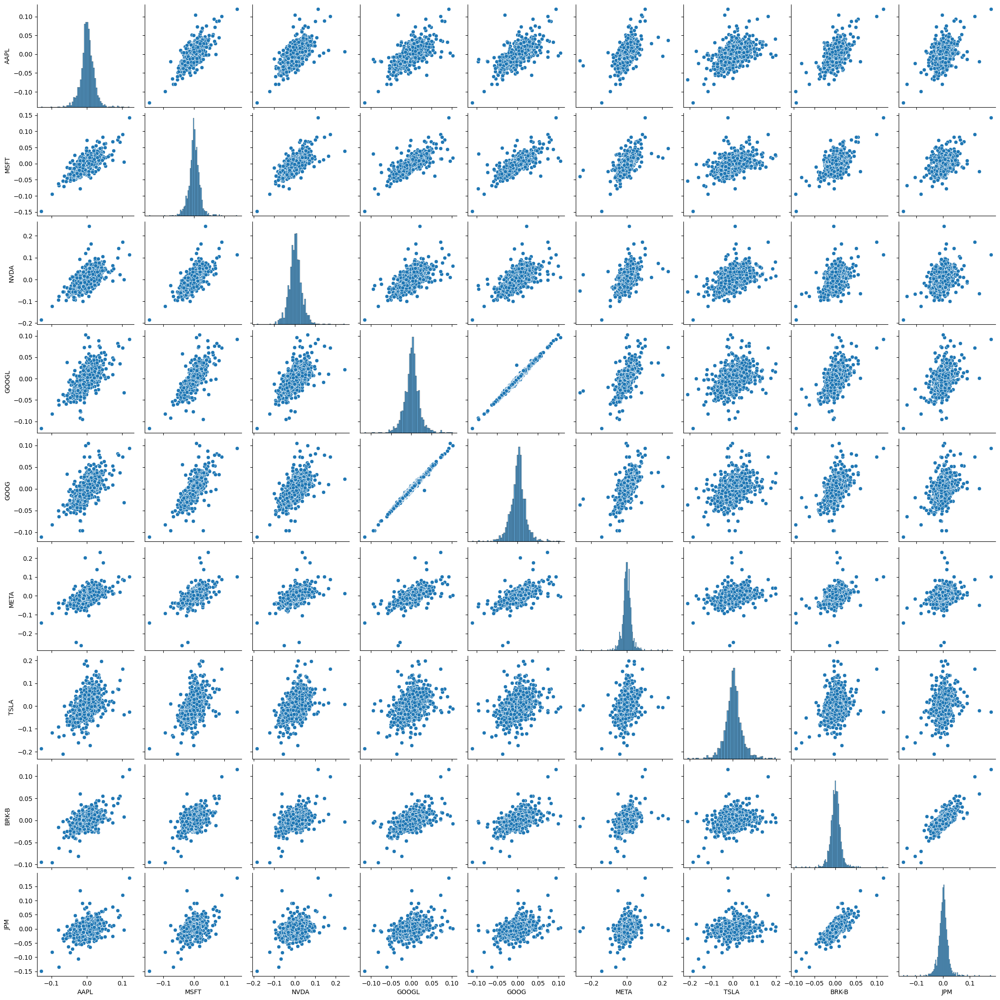

In [20]:
sns.pairplot(stock_returns)

### Function: Plot Correlation Heatmap

- **Purpose**: Visualizes pairwise correlations between variables in `data` using a heatmap.
- **Insights**: Highlights strength and direction of correlations.
- **Usage**: Helps identify relationships and dependencies among variables.

- **Correlation Matrix:** In finance and statistics, heatmaps are commonly used to visualize correlation matrices. Each cell in the heatmap represents the correlation coefficient between two variables, allowing quick identification of strong, weak, positive, or negative correlations.

In [21]:
def plot_correlation_heatmap(data):
    # Compute correlation matrix
    corr = data.corr()

    # Create a mask for the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Plot the heatmap
    plt.figure(figsize=(10, 10))
    sns.heatmap(corr, mask=mask, square=True, linewidths=.5, annot=True)
    plt.title('Correlation Matrix Heatmap')
    plt.show()

### Function: Draw Jointplot

- **Purpose**: Creates a joint plot to visualize pairwise relationships and distributions in `data`.
- **Insights**: Displays histograms along the diagonal, scatter plots in the lower triangle, and kernel density estimates in the upper triangle.
- **Usage**: Facilitates comprehensive exploratory data analysis (EDA) to understand correlations and patterns in the dataset.


In [22]:
def draw_jointplot(data):
    grid = sns.PairGrid(data.dropna())
    grid.map_diag(sns.histplot, bins=40, kde=True)
    grid.map_lower(sns.regplot)
    grid.map_upper(sns.kdeplot)

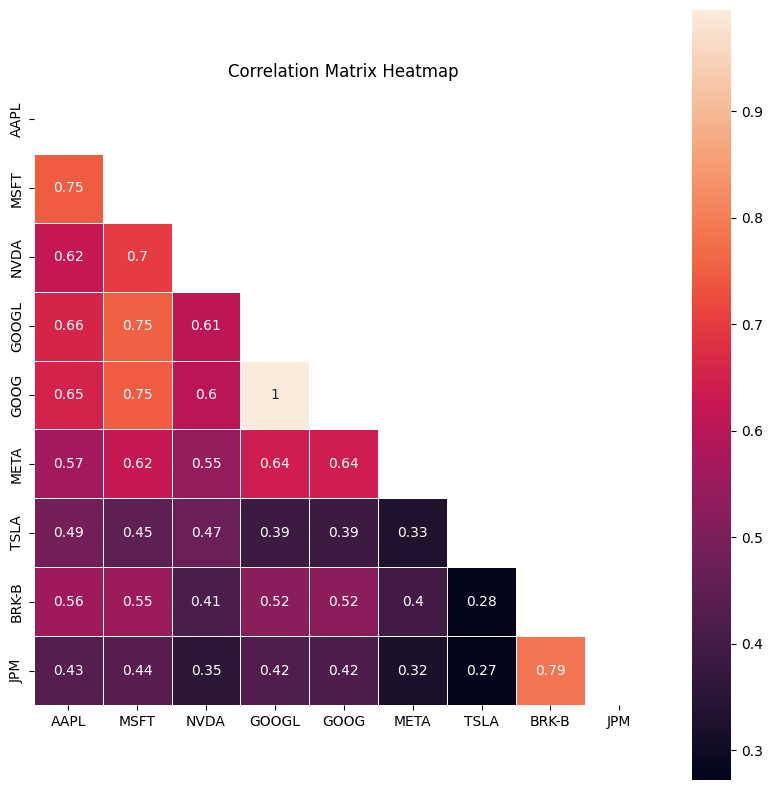

In [23]:
plot_correlation_heatmap(stock_returns)

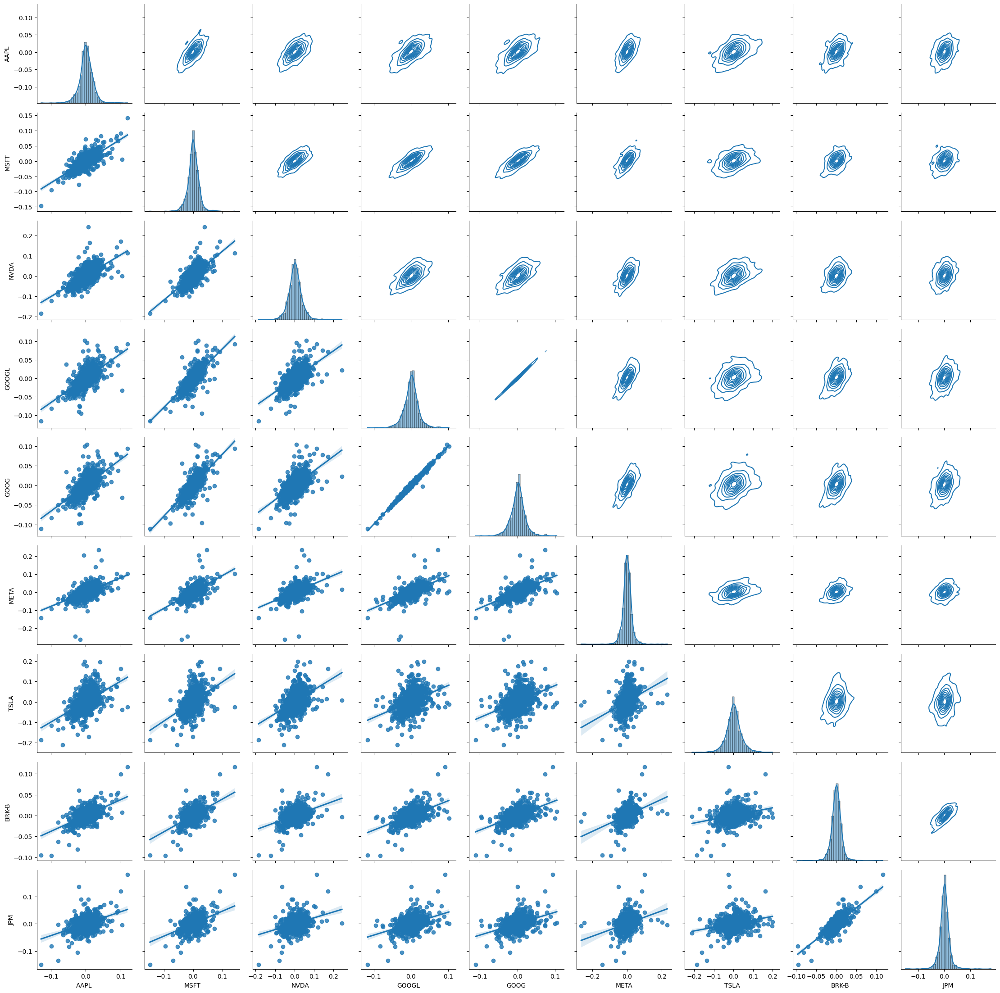

In [24]:
draw_jointplot(stock_returns)

## Portfolio strategy

### Calculating Mean Income and Covariation of Stock Returns

  - `mean_income`: Displays the average daily return for each stock.
  - `cov_returns`: Shows the covariance matrix, indicating how each pair of stocks' returns vary together.


In [25]:
mean_income = stock_returns.mean()  # Mean income for each stock
cov_returns = stock_returns.cov()   # Covariation
count = len(stock_returns.columns)
print(mean_income, cov_returns, sep='\n')

AAPL     0.001368
MSFT     0.001162
NVDA     0.003332
GOOGL    0.001135
GOOG     0.001138
META     0.001149
TSLA     0.002834
BRK-B    0.000635
JPM      0.000790
dtype: float64
           AAPL      MSFT      NVDA     GOOGL      GOOG      META      TSLA  \
AAPL   0.000403  0.000287  0.000413  0.000266  0.000265  0.000318  0.000402   
MSFT   0.000287  0.000365  0.000440  0.000291  0.000289  0.000332  0.000350   
NVDA   0.000413  0.000440  0.001088  0.000406  0.000402  0.000503  0.000637   
GOOGL  0.000266  0.000291  0.000406  0.000408  0.000405  0.000362  0.000320   
GOOG   0.000265  0.000289  0.000402  0.000405  0.000407  0.000361  0.000319   
META   0.000318  0.000332  0.000503  0.000362  0.000361  0.000783  0.000380   
TSLA   0.000402  0.000350  0.000637  0.000320  0.000319  0.000380  0.001678   
BRK-B  0.000152  0.000143  0.000185  0.000143  0.000143  0.000151  0.000153   
JPM    0.000176  0.000167  0.000235  0.000171  0.000171  0.000183  0.000224   

          BRK-B       JPM  
AAPL

### Generating Random Portfolio Shares

- **Purpose**: Generates random weights (shares) for a portfolio based on exponential random numbers normalized to sum up to 1.
- **Insights**: 
  - Utilizes NumPy's `randn` function to generate normally distributed random numbers.
  - Exponentiates these numbers to ensure positivity and then normalizes them to represent portfolio weights.
- **Usage**: Facilitates simulation and analysis of random portfolios for risk and return assessment in finance.


In [26]:
# Function, that generate random shares
def randomPortfolio():
    share = np.exp(np.random.randn(count))
    share = share / share.sum()
    return share

### Calculating Portfolio Income


- **Purpose**: Computes the expected income of a portfolio based on given portfolio weights and mean daily returns (`mean_income`).
- **Insights**: 
  - Uses NumPy's matrix multiplication (`np.matmul`) to calculate the dot product of mean daily returns and portfolio weights.
  - Provides an estimate of the expected income from the portfolio.
  

In [27]:
def IncomePortfolio(weights):
    return np.matmul(mean_income.values, weights)

### Calculating Portfolio Risk

- **Purpose**: Computes the risk (standard deviation) of a portfolio based on given portfolio weights (`weights`) and covariance matrix of daily returns (`cov_returns`).
- **Insights**: 
  - Utilizes NumPy's matrix multiplication (`np.matmul`) to calculate the risk of the portfolio.
  - Returns the square root of the resulting scalar value to obtain the standard deviation.
- **Usage**: Facilitates assessment of portfolio volatility and risk management based on assigned weights and covariance among stocks.


In [28]:
def RiskPortfolio(weights):
    return np.sqrt(np.matmul(np.matmul(weights, cov_returns.values), weights))

### Initializing Variables for Portfolio Simulation

  - `combinations`: Number of portfolio combinations to simulate (e.g., 10,000).
  - `risk`: Array of zeros to store calculated risks for each portfolio combination.
  - `income`: Array of zeros to store calculated incomes for each portfolio combination.
  - `portfolio`: 2D array of zeros to store portfolio compositions for each combination, where each row represents a combination and each column represents a stock.


In [29]:
combinations = 10000
risk = np.zeros(combinations)
income = np.zeros(combinations)
portfolio = np.zeros((combinations, count))

### Generating and Evaluating Portfolio Combinations

  - Generates random portfolio weights using `randomPortfolio()`.
  - Stores the generated weights in the `portfolio` array.
  - Calculates and stores the risk of each portfolio using `RiskPortfolio()`.
  - Calculates and stores the expected income of each portfolio using `IncomePortfolio()`.

In [30]:
# Function, which create new combinations of shares
for i in range(combinations):
    random_weights = randomPortfolio()

    portfolio[i, :] = random_weights
    risk[i] = RiskPortfolio(random_weights)
    income[i] = IncomePortfolio(random_weights)

### Visualizing Portfolio Risk and Income


  - **Scatter Plot**: Plots risk (x-axis) against income (y-axis).

  - **Max Sharpe Ratio**: Finds the index of the portfolio with the highest Sharpe Ratio (income-to-risk ratio).


- **Visualization Goal**: Helps in visually identifying portfolios with varying risk and income profiles, particularly highlighting the optimal portfolio with the best risk-adjusted return.

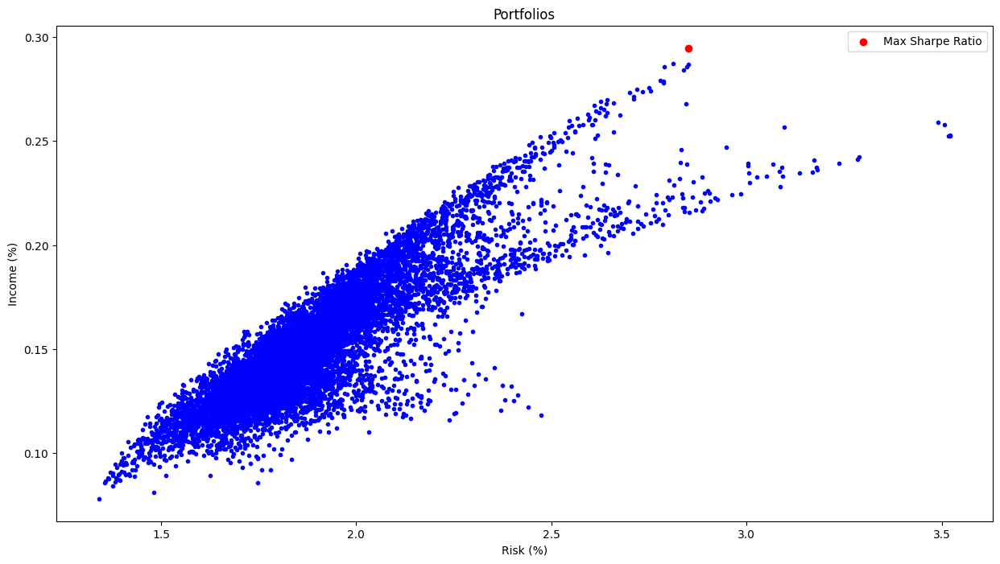

In [31]:
# Define the figure size
plt.figure(figsize=(15, 8))

# Plot the scatter plot for risk vs. income
plt.scatter(risk * 100, income * 100, c="b", marker=".")
plt.xlabel("Risk (%)")
plt.ylabel("Income (%)")
plt.title("Portfolios")

# Find the index of the portfolio with the maximum Sharpe Ratio
max_sharpe_ratio_index = np.argmax(income / risk)

# Highlight the portfolio with the maximum Sharpe Ratio
plt.scatter(
    risk[max_sharpe_ratio_index] * 100,
    income[max_sharpe_ratio_index] * 100,
    c="r",
    marker="o",
    label="Max Sharpe Ratio"
)

plt.legend()
plt.show()

### Displaying the Optimal Portfolio Weights

- **Identifying Best Portfolio**:`best_port` stores the portfolio weights that correspond to the maximum Sharpe Ratio.

- **Purpose**: Prints the stock ticker and its corresponding weight in the optimal portfolio.

- **Output**: Displays each stock and its weight, formatted for easy reading.

- **Usage**: Helps in understanding the composition of the optimal portfolio by showing the proportion of investment allocated to each stock.


In [32]:
best_port = portfolio[max_sharpe_ratio_index]


for i in range(len(sp500_list)):

    print("{} : {}".format(sp500_list[i], best_port[i]))

AAPL : 0.07363378439045837
MSFT : 0.012196586934173219
NVDA : 0.7008164249409681
GOOGL : 0.0034389828938765615
GOOG : 0.016037010403331477
META : 0.014887349360468505
TSLA : 0.15508082008000593
BRK-B : 0.014941882617300487
JPM : 0.008967158379417457


# Monte Carlo

### Setting Up for Monte Carlo Simulations

- **Simulation Parameters**:
  - **`days`**: Number of days for the simulation (e.g., 365 days).
  - **`dt`**: Time increment per day, calculated as `1 / days`.


- **Statistical Measures**:
  - **`mu`**: Mean daily returns for each stock, used as the expected return.
  - **`sigma`**: Standard deviation of daily returns for each stock, used as the volatility.


In [33]:
days = 365
dt = 1 / days

mu = stock_returns.mean()
sigma = stock_returns.std()

### Monte Carlo Simulation for Stock Prices


- **Purpose**: Simulates future stock prices over a specified number of days using the Monte Carlo method.

- **Parameters**:
  - `start_price`: Initial stock price.
  - `days`: Number of days to simulate.
  - `mu`: Mean daily return (expected return).
  - `sigma`: Standard deviation of daily returns (volatility).

- **Process**:
  - **Initialization**: Sets up arrays for `price`, `shock`, and `drift`.
  - **Simulation Loop**:
    - **Shock**: Random normal variable representing the stochastic part of the price change.
    - **Drift**: Deterministic part of the price change based on the mean return.
    - **Price Update**: Calculates the new price based on the previous price, shock, and drift.
  
- **Output**: 
  - Returns an array of simulated stock prices over the specified number of days.

- **Usage**: 
  - Provides a probabilistic model of future stock prices.
  - Useful for risk management, option pricing, and assessing potential investment outcomes.
  - The function uses a combination of deterministic (drift) and stochastic (shock) components to model the random nature of stock price movements.


In [34]:
def monte_carlo(start_price, days, mu, sigma):

    price = np.zeros(days)

    price[0] = start_price

    for x in range(1, days):

        shock = np.random.normal(loc=mu * dt, scale=sigma*np.sqrt(dt))

        drift = mu * dt

        price[x] = price[x-1] + (price[x-1] * (drift + shock))

    return price

### Monte Carlo Simulation and Visualization for Stock Prices

- **Purpose**: Runs multiple Monte Carlo simulations for a given stock and visualizes the results.

- **Process**:
  - **Initialization**:
    - `start_price`: Retrieves the initial adjusted closing price of the stock.
    - `sim`: Initializes an array to store the final simulated prices.
  - **Plotting Simulation Paths**:
    - **Loop**: Runs 1000 Monte Carlo simulations.
      - **Simulation**: Calls `monte_carlo` to generate future price paths.
      - **Store Results**: Saves the final simulated price to `sim`.
      - **Plot Paths**: Plots each simulated price path.
    - **Graph**: Displays the simulated price paths over time.
  - **Histogram of Final Prices**:
    - **Plot**: Displays a histogram of the final simulated prices after 365 days.
    - **Statistics**: Shows mean, standard deviation, and starting price on the histogram plot.

- **Visual Outputs**:
  - **Price Paths**: Line plot showing the evolution of simulated stock prices over time.
  - **Distribution of Final Prices**: Histogram showing the distribution of final stock prices after the simulation period.

- **Usage**:
  - Provides a probabilistic forecast of future stock prices.
  - Helps in understanding potential price ranges and risks.


In [35]:
def monte_carlo_plots(stock):

    start_price = globals()[stock]['Adj Close'].iloc[0]
    sim = np.zeros(1000)

    plt.figure(figsize=(15, 8))

    for i in range(1000):

        result = monte_carlo(start_price, days, mu[stock], sigma[stock])

        sim[i] = result[days - 1]

        plt.plot(result)

    plt.xlabel('Days')
    plt.ylabel('Price')
    plt.title('Monte Carlo analysis for ' + stock)

    plt.figure(figsize=(10, 7))

    plt.hist(sim, bins=100)

    plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(
        sim.mean(), sim.std(), start_price))

    plt.xlabel('Final Price')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of Final Prices for {stock}')
    plt.grid(True)

    plt.show()

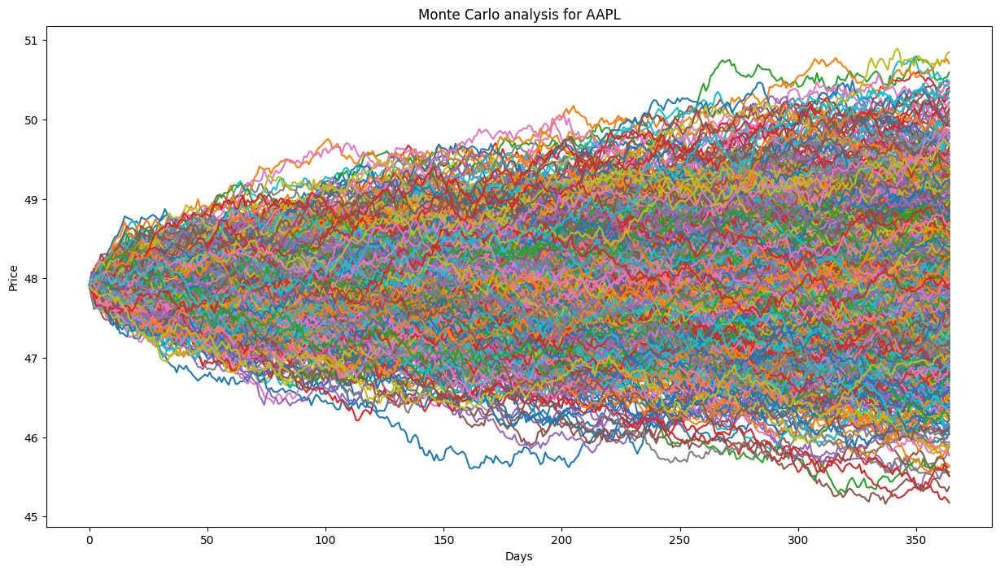

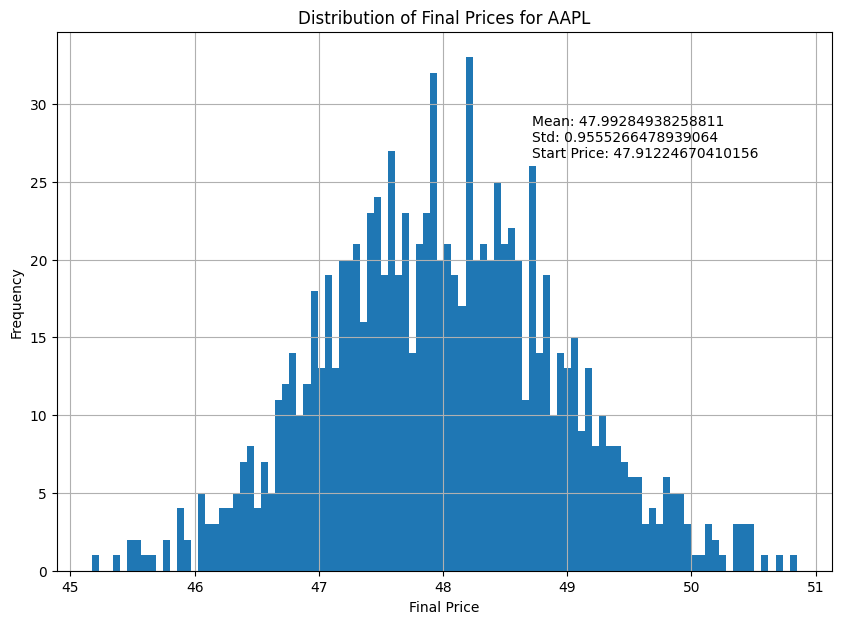

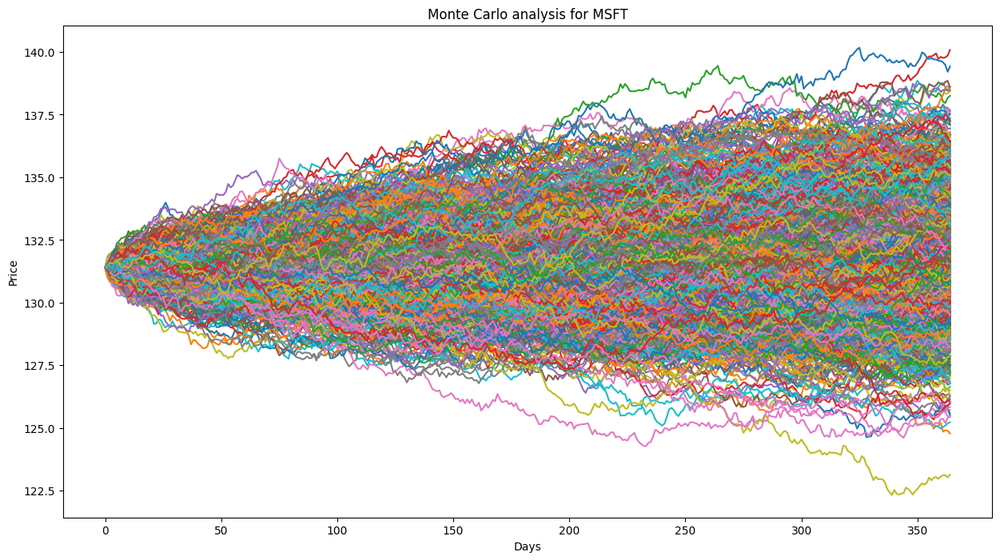

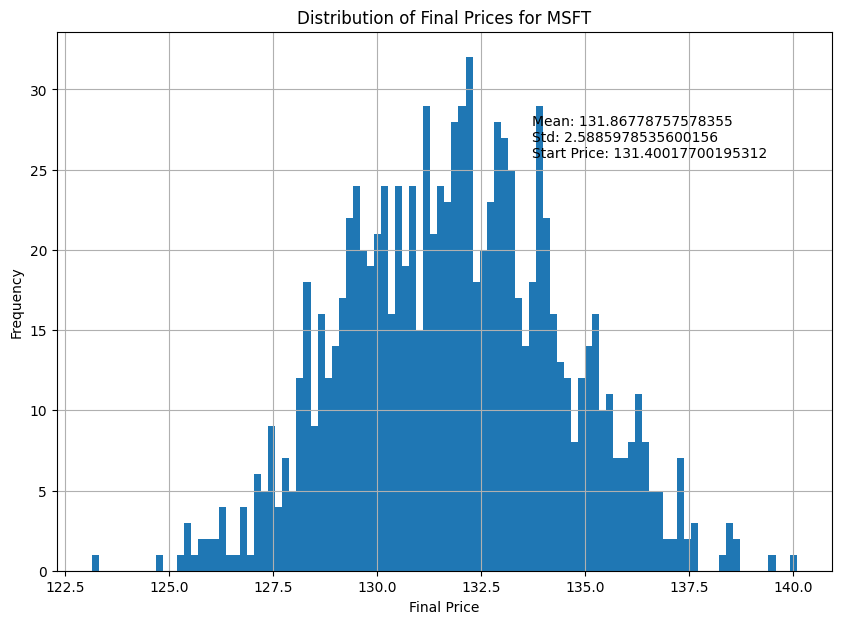

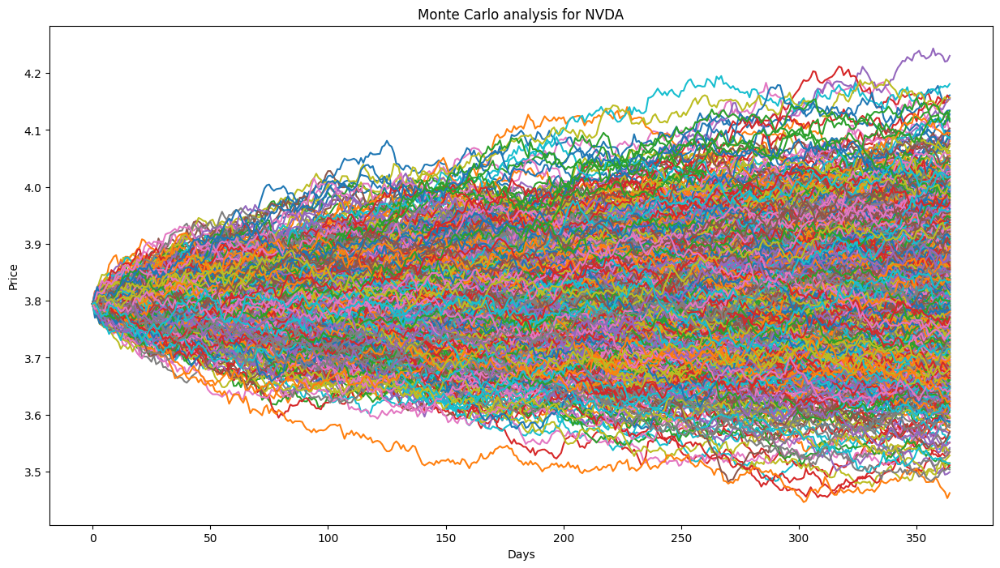

...

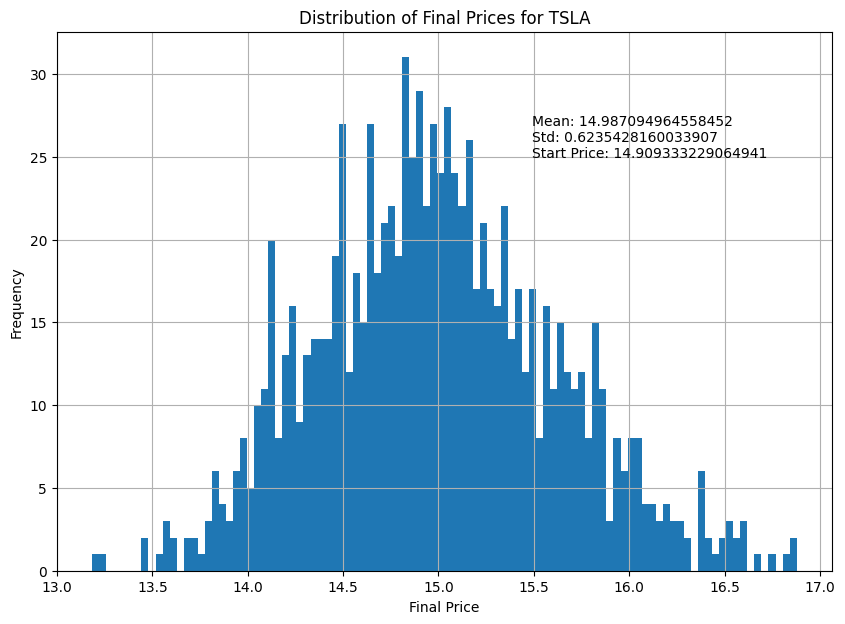

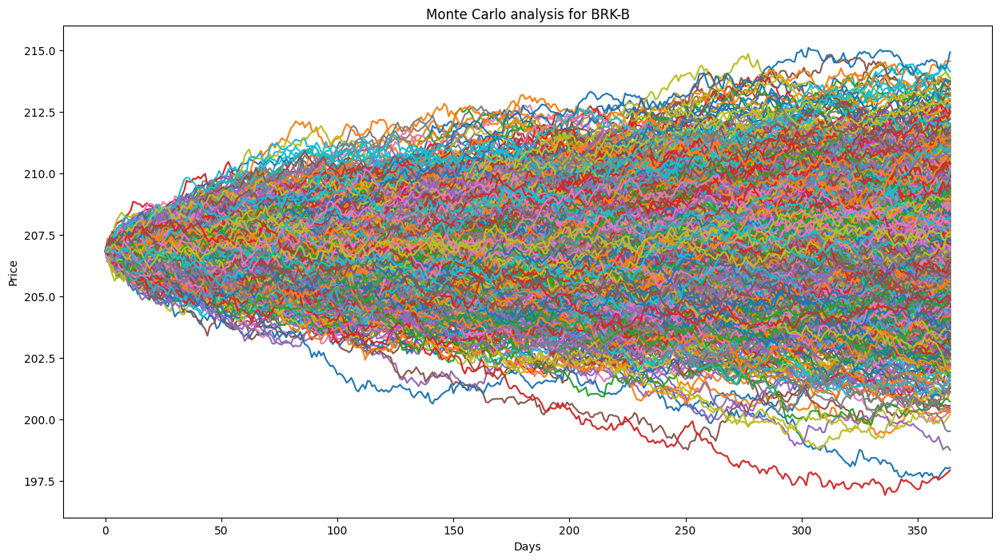

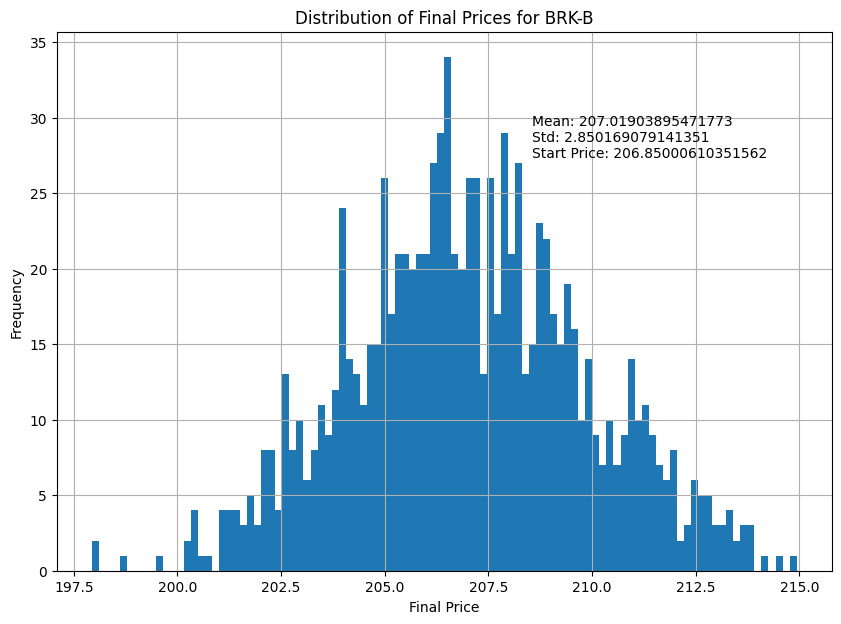

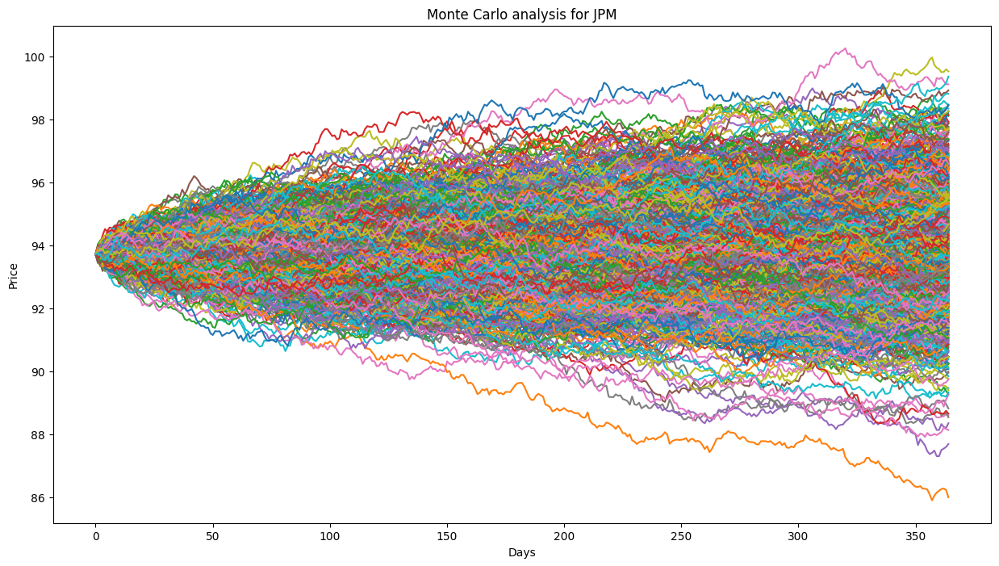

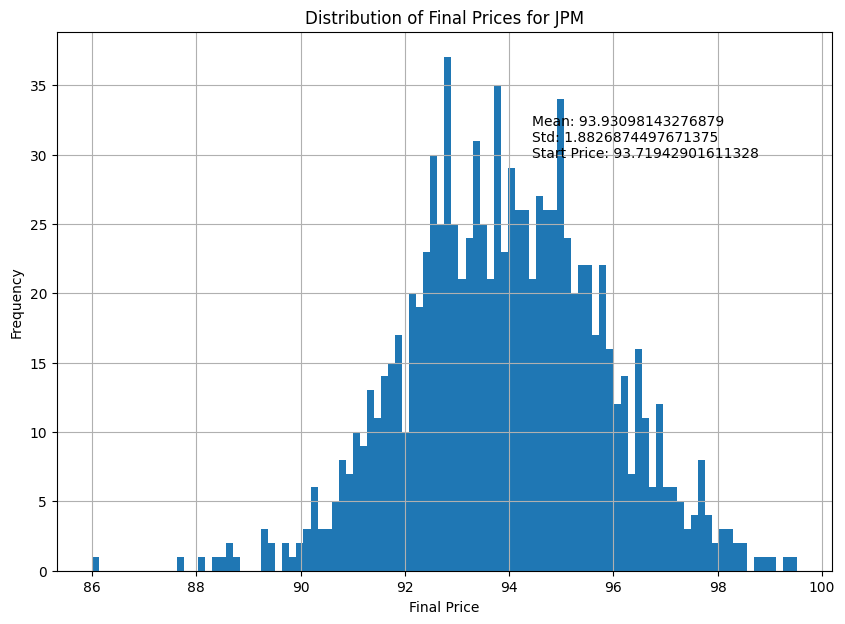

In [36]:
for stock in sp500_list:

    monte_carlo_plots(stock)